In [1]:
from datetime import datetime

print()
start = datetime.now()
print(f'Start Time : {start}')


Start Time : 2023-08-03 13:41:07.014005


In [3]:
from tab_opt.optimize.mcmc import inv_kernel_vmap, inv_kernel, log_normal, log_multinorm, log_multinorm_sum
from tabascal.jax.coordinates import orbit
from tabascal.utils.jax import progress_bar_scan

from jax import random, jit, vmap, jacrev
import jax.numpy as jnp

from jax.flatten_util import ravel_pytree as flatten
from jax.lax import scan

from jax.tree_util import tree_map
import jax

from functools import partial

import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import h5py

import dask.array as da
import xarray as xr

import os

plt.rcParams['font.size'] = 16

In [99]:
def kernel(x, var, a, noise=1e-3):
    x_ = a*(x[:,None] - x[None,:])
    K = var * jnp.exp(-x_**2) + noise**2 * jnp.eye(len(x))
    return K

def kernel_F(k, var, a):
    aa = jnp.pi / a
    k_ = aa*k
    Pk = var / jnp.sqrt(aa) * jnp.exp(-k_**2)
    return Pk

In [125]:
var = 1.
a = 1e-2

x = jnp.arange(0, 300, 2)

K = kernel(x, var, a)
L = jnp.linalg.cholesky(K)
y = random.normal(random.PRNGKey(1), (len(x), 1000))
y1 = L@y

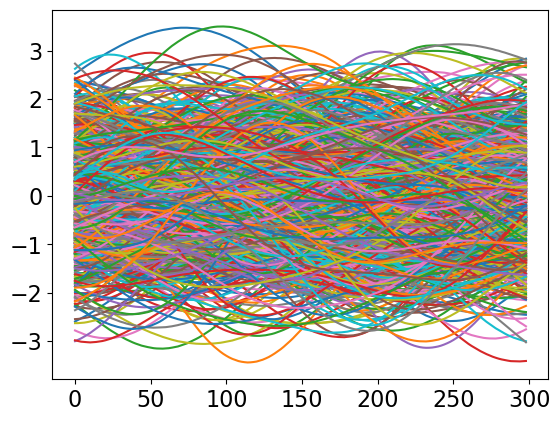

In [126]:
plt.plot(x, y1);

In [136]:
k = jnp.fft.fftfreq(len(x), jnp.diff(x)[0])

K_ = kernel_F(k, var, a)

Y = jnp.fft.fft(y)
y2 = jnp.fft.ifft(jnp.sqrt(K_)[:,None] * Y, axis=0)

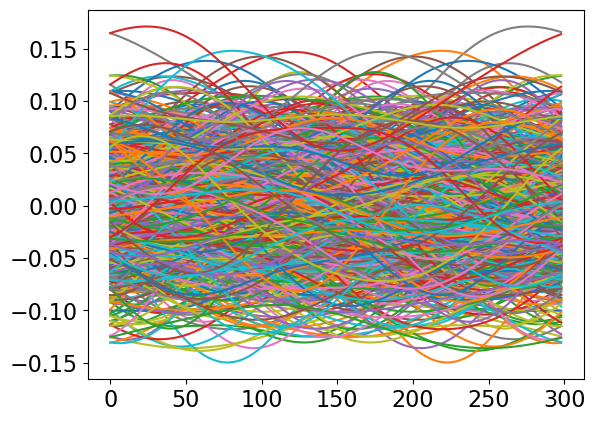

In [137]:
plt.plot(x, y2);

In [129]:
cov1 = jnp.cov(y1)
cov2 = jnp.cov(y2)

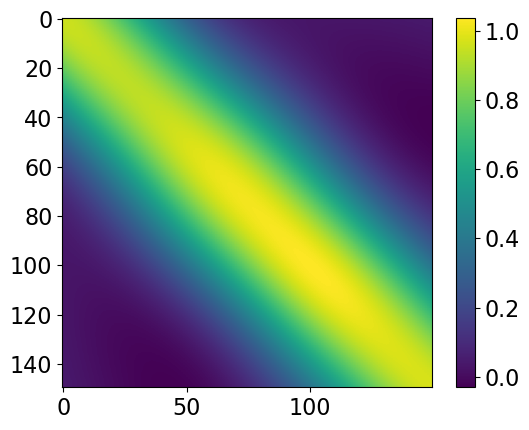

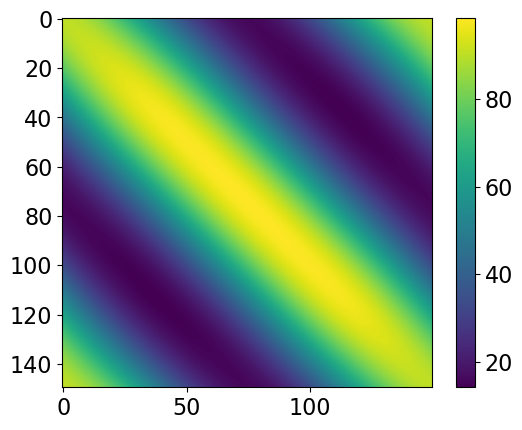

In [130]:
plt.imshow(cov1)
plt.colorbar()

plt.figure()
plt.imshow(cov2.real)
plt.colorbar()

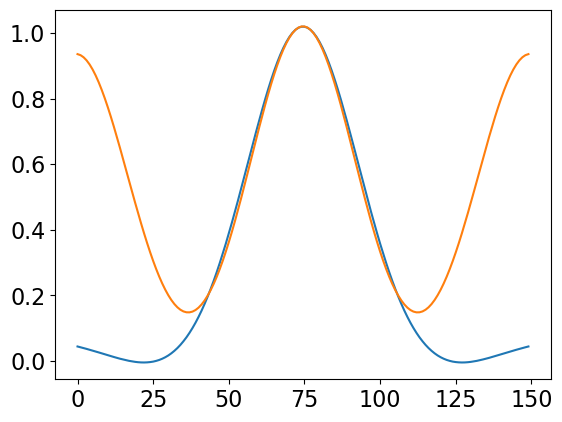

In [146]:
plt.plot(jnp.diag(cov1[::-1]))
plt.plot(jnp.diag(cov2[::-1])/96.5)

In [135]:
jnp.rad2deg(jnp.angle(cov2)).max()

Array(2.88659128, dtype=float64)

In [3]:
N_ant = 3

sim_dir = "/Users/chrisfinlay/Documents/PhD/tabascal/tabascal/tabascal/examples/"
f_name = f"target_obs_{N_ant:02}A_450T-0440-1338_128I_001F-1.227e+09-1.227e+09_100AST_1SAT_0GRD/"

sim_path = os.path.join(sim_dir, f_name)

ds = xr.open_zarr(sim_path)

In [4]:
sampling = 1
N_time = 300

N_int_samples = ds.attrs["n_int_samples"]//sampling
N_ant = ds.attrs["n_ant"]
N_bl = ds.attrs["n_bl"]
# N_time = ds.attrs["n_time"]
times = ds.coords["time"].data[:N_time]
times_fine = ds.coords["time_fine"].data[:N_time*N_int_samples:sampling]
bl_uvw = ds.bl_uvw.data.compute()[:N_time*N_int_samples:sampling]
ants_uvw = ds.ants_uvw.data.compute()[:N_time*N_int_samples:sampling]
ants_xyz = ds.ants_xyz.data.compute()[:N_time*N_int_samples:sampling]
vis_ast = ds.vis_ast.data.compute()[:N_time*N_int_samples:sampling]
vis_rfi = ds.vis_rfi.data.compute()[:N_time*N_int_samples:sampling]
vis_obs = ds.vis_obs.data.compute()[:N_time]
noise = ds.noise_std.data.compute()[:N_time]
noise_data = ds.noise_data.data.compute()[:N_time]
int_time = ds.attrs["int_time"]
freqs = ds.coords["freq"].data
gains_ants = ds.gains_ants.data.compute()[:N_time*N_int_samples:sampling]
rfi_A_app = ds.rfi_sat_A.data.compute()[0,:N_time*N_int_samples:sampling]
rfi_orbit = ds.rfi_sat_orbit.data.compute()[0]

In [5]:
vis_obs.shape

(300, 3, 1)

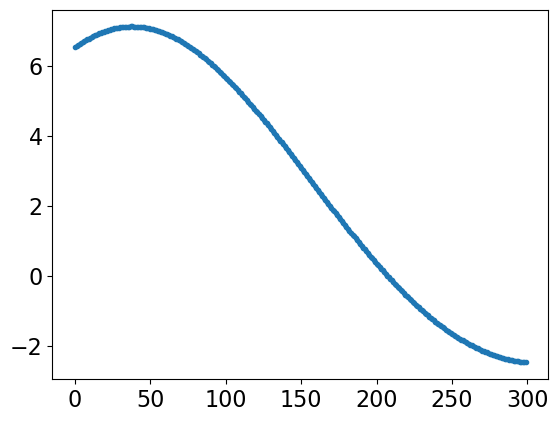

In [6]:
plt.plot(np.real(vis_ast)[::N_int_samples,0,0], '.')

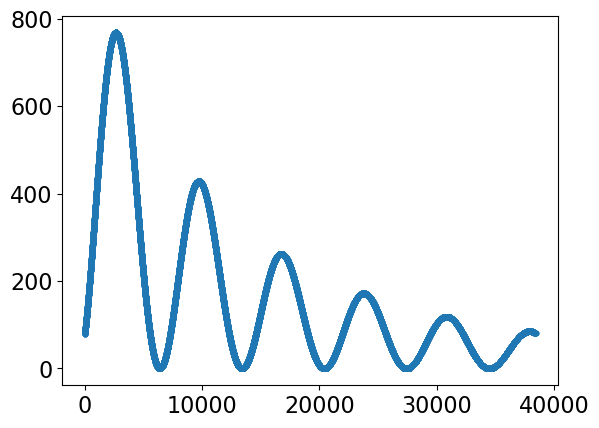

In [7]:
plt.plot(np.abs(vis_rfi)[:,0,0], '.')

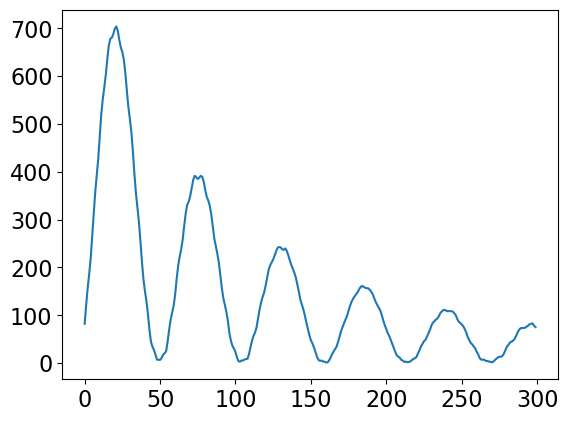

In [8]:
plt.plot(np.abs(vis_obs)[:,0,0])

In [9]:
from tabascal.jax.interferometry import ants_to_bl
a1 = ds.antenna1.data.compute()
a2 = ds.antenna2.data.compute()
gains_bl = ants_to_bl(gains_ants.reshape(N_time, -1, N_ant, 1).mean(axis=1), a1, a2)

v_ast = vis_ast.reshape(N_time,-1,N_bl,1).mean(axis=1)

v_cal = vis_obs/gains_bl

flags = jnp.where(jnp.abs(v_ast-v_cal)>3*noise, True, False)

In [10]:
# rng = np.random.default_rng(123)
# rfi_gains = np.exp(1.j*times_fine/100.)[:,None,None] * np.exp(2.j*np.pi*rng.uniform(size=N_ant))[None,:,None]
rfi_gains = np.ones((N_time*N_int_samples, N_ant, 1))

# v_rfi = rfi_gains[:,a1]*np.conj(rfi_gains[:,a2])*vis_rfi

v_rfi = vis_rfi

In [11]:
v_obs = ( gains_ants[:,a1]*np.conj(gains_ants[:,a2]) * (vis_ast + v_rfi) ).reshape(N_time, N_int_samples, N_bl, 1).mean(axis=1) + noise_data

In [12]:
print(f'Mean RFI Amp. : {jnp.mean(jnp.abs(v_rfi)):.0f} Jy\nFlag Rate :     {100*flags.mean():.2f} %')

Mean RFI Amp. : 164 Jy
Flag Rate :     94.67 %


In [13]:
print()
print(f'Number of Antennas: {N_ant}')
print()
print(f'Number of Time Steps: {N_time}')


Number of Antennas: 3

Number of Time Steps: 300


In [14]:
@jit
def kernel(x, x_, var, l, noise=1e-3):
    '''
    x: array (n_points, n_dim)
    '''
    x = x[:,None] if x.ndim==1 else x
    x_ = x_[:,None] if x_.ndim==1 else x_
    chi = jnp.linalg.norm(x[None,:,:]-x_[:,None,:], axis=-1) / l
    cov = jnp.abs(var)*jnp.exp(-0.5*chi**2)
    if chi.shape[0]==chi.shape[1]:
        cov += noise*jnp.eye(x.shape[0])
    return cov

@jit
def resampling_kernel(x, x_, var, l, noise=1e-3):
    K_inv = jnp.linalg.inv(kernel(x, x, var, l, noise))
    K_s = kernel(x, x_, var, l)
    return K_s@K_inv

In [15]:
@jit
def gp_resample(y, x, x_, var, l, noise=1e-3):
    K_inv = jnp.linalg.inv(kernel(x, x, var, l, noise))
    K_s = kernel(x, x_, var, l)
    return K_s@K_inv@y

@jit
def resampled_cov(x, x_, var, l, noise_cov):
    K = kernel(x, x, var, l, 1e-3)
    K_inv = jnp.linalg.inv(K + noise_cov)
    K_s = kernel(x, x_, var, l)
    K_ss = kernel(x_, x_, var, l)
    return K_ss - K_s@K_inv@K_s.T

In [16]:
def l_from_uv(uv, l0=7e2, a=6e-4):
    return l0*jnp.exp(-a*uv)

def get_times(gp_l, times):
    
    int_time = times[1] - times[0]
    t_i = times[0] - int_time/2
    t_f = times[-1] + int_time/2
    n_vis_times = jnp.ceil(2. * ((t_f - t_i)/gp_l) + 1).astype(int)
    vis_times = jnp.linspace(t_i, t_f, n_vis_times)
    
    return vis_times

def fringe_phasor(w, freq):
    
    from tabascal.jax.interferometry import c
    phasor = jnp.exp(-2.j*jnp.pi*freq/c*w)
    
    return phasor

def derotated_vis_phase(vis, w, freq):
    
    derotated_vis = vis*fringe_phasor(w, freq)
    phase = jnp.unwrap(jnp.angle(derotated_vis), discont=0.0)
    
    return phase

def derotated_vis(vis, w, freq):
    
    return vis*fringe_phasor(w, freq)

In [17]:
# @jit
# def rfi_closures(q, params, ants):

#     # rfi_amp = flatten(q['rfi_amp'])[0].reshape(N_ant,N_rfi_time)[ants]
#     # rfi_amp = (params['resample_rfi']@rfi_amp.T).T
    
#     rfi_real = flatten(q['rfi_real'])[0].reshape(N_ant,N_rfi_time)[ants]
#     rfi_imag = flatten(q['rfi_imag'])[0].reshape(N_ant,N_rfi_time)[ants]
#     rfi_amp = (params['resample_rfi']@(rfi_real + 1.j*rfi_imag).T).T

#     rfi_xyz = orbit(params['times_fine'], *q['rfi_orbit'])
#     distances = jnp.linalg.norm(params['ants_xyz'][:,ants]-rfi_xyz[:,None,:], axis=2)
#     c_distances = (distances-params['phase_corrections'][:,ants])[...,None]

#     return rfi_amp, c_distances

# @jit
# def rfi_vis(app_amplitude, c_distances, freqs):
#     '''
#     Calculate visibilities from distances to rfi sources.

#     Parameters:
#     -----------
#     app_amplitude: jnp.array (n_time, 2, n_freq, n_src)
#         Apparent amplitude at the antennas.
#     c_distances: jnp.array (n_time, 2, n_src)
#         The phase corrected distances between the rfi sources and the antennas.
#     freqs: jnp.array (n_freq,)
#         Frequencies.

#     Returns:
#     --------
#     vis: jnp.array (n_time, 1, n_freq)
#         The visibilities.
#     '''
#     n_time, n_ant, n_freq, n_src = app_amplitude.shape
#     c = 2.99792458e8

#     # Create array of shape (n_time, n_bl, n_freq, n_src) and then sum over n_src

#     minus_two_pi_over_lamda = (-2.0*jnp.pi*freqs/c).reshape(1,1,n_freq,1)

#     c_distances = c_distances.reshape(n_time,n_ant,1,n_src)

#     phase = minus_two_pi_over_lamda*(c_distances[:,0]-c_distances[:,1])
#     intensities_app = app_amplitude[:,0]*jnp.conj(app_amplitude[:,1])

#     vis = jnp.sum(intensities_app*jnp.exp(1.j*phase), axis=-1)

#     return vis

@jit
def baseline_gains(q, params, ants):
    
    G_amp = flatten(q['g_amp'])[0].reshape(N_ant, N_g_time)[ants]
    G_phase = flatten(q['g_phase'])[0].reshape(N_ant-1, N_g_time)
    G_phase = jnp.concatenate([G_phase, jnp.zeros((1, N_g_time))], axis=0)[ants]
    
    G_amp = (params['resample_g_amp']@G_amp.T).T
    G_phase = (params['resample_g_phase']@G_phase.T).T
    

    G = G_amp*jnp.exp(1.j*G_phase)
    
    return G[0]*jnp.conjugate(G[1])

@jit
def pad_vis(vis):
    
    return jnp.pad(vis, (0, N_vis_time-vis.shape[0]))

# @jit
# def rfi_vis_model(q, params, ant1, ant2):
    
#     q = scale_parameters(q, inv_scalings)
    
#     ants = jnp.array([ant1, ant2])
    
#     rfi_amp, c_distances = rfi_closures(q, params, ants)
#     V_rfi = rfi_vis(rfi_amp.T[:,:,None,None], c_distances, params['freqs'])[...,0]
    
#     return V_rfi

@jit
def rfi_vis_model(q, params, ants, bl):
    
    a1, a2 = ants
    rfi_amp = flatten(q['rfi_amp'])[0].reshape(N_ant,N_rfi_time)[ants]
    rfi_I = rfi_amp[0]*rfi_amp[1]
    V_rfi = params['rfi_kernel'][:,:,bl]@rfi_I
    
    return V_rfi

@jit
def ast_vis_model(q, params, bl):

    V_real = flatten(tree_map(pad_vis, q['v_real']))[0].reshape(N_bl, N_vis_time)[bl]
    V_imag = flatten(tree_map(pad_vis, q['v_imag']))[0].reshape(N_bl, N_vis_time)[bl]
    V_ast = V_real + 1.j*V_imag
    
    V_ast = params['resample_vis'][bl]@V_ast
    
    return V_ast

@jit
def model(q, params, ant1, ant2, bl):
    
    q = scale_parameters(q, inv_scalings)

    ants = jnp.array([ant1, ant2])
    
    V_real = flatten(tree_map(pad_vis, q['v_real']))[0].reshape(N_bl, N_vis_time)[bl]
    V_imag = flatten(tree_map(pad_vis, q['v_imag']))[0].reshape(N_bl, N_vis_time)[bl]
    V_ast = V_real + 1.j*V_imag
    
    V_ast = params['resample_vis'][bl]@V_ast

#     Calculate the visibility contribution from the RFI
    # rfi_amp, c_distances = rfi_closures(q, params, ants)
    # V_rfi = rfi_vis(rfi_amp.T[:,:,None,None], c_distances, params['freqs'])[...,0]
    # V_rfi = V_rfi.reshape(N_time, N_int_samples).mean(axis=1)
    
    V_rfi = rfi_vis_model(q, params, ants, bl)

    G_bl = baseline_gains(q, params, ants)

    model_vis = (G_bl*(V_ast+V_rfi))

    return jnp.concatenate([model_vis.real.flatten(), model_vis.imag.flatten()])

# @jit
def scale_parameters(q, scalings):
    q['g_amp'] = tree_map(lambda x: scalings['g_amp']*x, q['g_amp'])
    q['g_phase'] = tree_map(lambda x: scalings['g_phase']*x, q['g_phase'])
    # q['rfi_orbit'] = scalings['rfi_orbit']@q['rfi_orbit']
    return q

In [18]:
# scalings = {'g_amp': jnp.array([100.]),
#             'g_phase': jnp.rad2deg(1.),
#             'rfi_orbit': jnp.diag(jnp.array([1e-2, 3600e0, 3600e1, 3600e1]))}

# scalings = {'g_amp': jnp.array([1.]),
#             'g_phase': jnp.array([1.]),
#             'rfi_orbit': jnp.eye(4)}

# inv_scalings = tree_map(lambda x: jnp.linalg.inv(x) if x.ndim==2 else 1./x, scalings)

# Calculate approximate True values

def l_from_uv(uv, l0=7e2, a=6e-4):
    return l0*jnp.exp(-a*uv)

a1, a2 = jnp.triu_indices(N_ant, 1)
mag_uvw = jnp.linalg.norm(ants_uvw[0, a1] - ants_uvw[0, a2], axis=-1)
vis_var = (jnp.abs(vis_ast).max(axis=(0,2)) + noise)**2
vis_l = l_from_uv(mag_uvw, l0=5e2)

# g_amp_var = (0.01*scalings['g_amp'])**2
# g_phase_var = (jnp.deg2rad(1.)*scalings['g_phase'])**2

g_amp_var = (1e-2)**2
g_phase_var = jnp.deg2rad(1.)**2
g_l = 10e3

rfi_var, rfi_l = 1e6, 15.

rfi_var, rfi_l = jnp.max(jnp.abs(vis_rfi)), 15.

T_time = times[-1]-times[0]+int_time
n_vis_times = jnp.ceil(2.*T_time/vis_l).astype(int)
n_vis_times = jnp.where(n_vis_times<3, 3, n_vis_times)
get_times = partial(jnp.linspace, *(times[0]-int_time/2, times[-1]+int_time/2))
vis_times = tuple(map(get_times, n_vis_times))
N_vis_time = int(n_vis_times.max())

vis_idxs = [jnp.floor(jnp.linspace(0, len(times_fine)-1, n_vis_times[i])).astype(int) for i in range(N_bl)]

Nt_fine = len(times_fine)
#####
Nt_g = N_int_samples*45
# Nt_g = N_int_samples * 150
g_idx = jnp.array(list(np.arange(0, Nt_fine, Nt_g)) + \
                [Nt_fine-1,])
times_g = times_fine[g_idx]
N_g_time = len(times_g)
G = gains_ants[g_idx,:,0].T
#####
Nt_rfi = N_int_samples # 2
rfi_idx = jnp.array(list(np.arange(0, Nt_fine, Nt_rfi)) + \
                [Nt_fine-1,])
times_rfi = times_fine[rfi_idx]
N_rfi_time = len(times_rfi)
rfi_A = rfi_A_app[rfi_idx,:,0].T

rfi_signal = rfi_A_app*rfi_gains
rfi_real = rfi_signal[rfi_idx,:,0].T.real
rfi_imag = rfi_signal[rfi_idx,:,0].T.imag

######
true_values = {'g_amp': {i: x for i, x in enumerate(jnp.abs(G))},
               'g_phase': {i: x for i, x in enumerate(jnp.angle(G[:-1]))},
               'rfi_amp': {i: x for i, x in enumerate(rfi_A)},
               # 'rfi_real': {i: x for i, x in enumerate(rfi_real)},
               # 'rfi_imag': {i: x for i, x in enumerate(rfi_imag)},
               # 'rfi_orbit': rfi_orbit,
               'v_real': {i: vis_ast.real[vis_idxs[i],i,0] for i in range(N_bl)},
               'v_imag': {i: vis_ast.imag[vis_idxs[i],i,0] for i in range(N_bl)}
               }

# true_values = scale_parameters(true_values, scalings)
flat_true_values, unflatten = flatten(true_values)

####################################################################

In [19]:
# Set Constant Parameters
params = {'freqs': freqs,
          'times_fine': times_fine,
          'noise': noise if noise>0 else 0.2,
          'ants_xyz': ants_xyz,
          'phase_corrections': ants_uvw[...,-1],
          # 'vis_obs': vis_obs[:,:,0],
          # 'vis_obs': v_obs[:,:,0],
          'vis_obs': jnp.concatenate([v_obs[:,:,0].real, v_obs[:,:,0].imag], axis=0),
          'vis_ast_true': v_ast[:,:,0].T,
#           
          # 'N_g_times': N_g_time,
          'N_time': N_time,
          'N_ants': N_ant,
          'N_bl': N_bl,
          'a1': a1,
          'a2': a2,
          }

def sym(x):
    return (x + x.T)/2.

# rfi_cov_fp = 'data/RFIorbitCov5min.npy'

# cov_RFI_orbit = scalings['rfi_orbit']@np.load(rfi_cov_fp)@scalings['rfi_orbit']
# inv_cov_RFI_orbit = sym(jnp.linalg.inv(cov_RFI_orbit))
# rfi_orbit = rfi_orbit

prior_params = {
    # 'mu_RFI_orbit': scalings['rfi_orbit']@rfi_orbit,
                # 'inv_cov_RFI_orbit': inv_cov_RFI_orbit,
                # 'mu_G_amp': scalings['g_amp']*jnp.abs(G),
                # 'mu_G_phase': scalings['g_phase']*jnp.angle(G)[:-1],
                'mu_G_amp': jnp.abs(G),
                'mu_G_phase': jnp.angle(G)[:-1],
                'rfi_amp_std': 100.0,
                'mu_vis': {i: jnp.zeros(len(vis_times[i])) for i in range(N_bl)},
                # 'inv_cov_vis': {i: inv_kernel(vis_times[i][:,None], vis_var[i], 
                #                               vis_l[i]) for i in range(N_bl)},
                # 'inv_cov_G_amp': inv_kernel(times_g[:,None],
                #                             g_amp_var, g_l),
                # 'inv_cov_G_phase': inv_kernel(times_g[:,None],
                #                               g_phase_var, g_l),
                'resample_vis': {i: resampling_kernel(vis_times[i], times, vis_var[i], 
                                                      vis_l[i], 1e-3) for i in range(N_bl)},
                'resample_g_amp': resampling_kernel(times_g, 
                                                    times, 
                                                    g_amp_var, g_l, 1e-8),
                'resample_g_phase': resampling_kernel(times_g, 
                                                      times, 
                                                      g_phase_var, g_l, 1e-8),
                'resample_rfi': resampling_kernel(times_rfi, 
                                                  params['times_fine'], 
                                                  rfi_var, rfi_l, 1e-6)
               }

# prior_params['resample_vis'] = jnp.array([jnp.pad(x, ((0,0),(0,N_vis_time-x.shape[1]))) 
#                                           for x in prior_params['resample_vis'].values()])

prior_params['cov_G_amp'] = kernel(times_g, times_g, g_amp_var, g_l)
prior_params['cov_G_phase'] = kernel(times_g, times_g, g_phase_var, g_l)

prior_params['L_G_amp'] = jnp.linalg.cholesky(kernel(times_g, times_g, g_amp_var, g_l))#[None,:,:] * jnp.ones((N_ant, 1, 1))
prior_params['L_G_phase'] = jnp.linalg.cholesky(kernel(times_g, times_g, g_phase_var, g_l))

prior_params['L_RFI_amp'] = jnp.linalg.cholesky(kernel(times_rfi, times_rfi, rfi_var, rfi_l))

prior_params['L_vis'] = [jnp.linalg.cholesky(kernel(vis_times[i], vis_times[i], vis_var[i], 
                                              vis_l[i])) for i in range(N_bl)]

params.update(prior_params)

flatten(true_values['v_real'])[0].shape[0], N_vis_time*N_bl, N_time*N_bl, \
flatten(true_values['v_real'])[0].shape[0]/(N_vis_time*N_bl), \
flatten(true_values['v_real'])[0].shape[0]/(N_time*N_bl)

(47, 72, 900, 0.6527777777777778, 0.052222222222222225)

In [20]:
vis_times

(Array([ 439.,  589.,  739.,  889., 1039.], dtype=float64),
 Array([ 439.        ,  465.08695652,  491.17391304,  517.26086957,
         543.34782609,  569.43478261,  595.52173913,  621.60869565,
         647.69565217,  673.7826087 ,  699.86956522,  725.95652174,
         752.04347826,  778.13043478,  804.2173913 ,  830.30434783,
         856.39130435,  882.47826087,  908.56521739,  934.65217391,
         960.73913043,  986.82608696, 1012.91304348, 1039.        ],      dtype=float64),
 Array([ 439.        ,  474.29411765,  509.58823529,  544.88235294,
         580.17647059,  615.47058824,  650.76470588,  686.05882353,
         721.35294118,  756.64705882,  791.94117647,  827.23529412,
         862.52941176,  897.82352941,  933.11764706,  968.41176471,
        1003.70588235, 1039.        ], dtype=float64))

In [21]:
# params['resample_vis'].shape

In [22]:
resample_rfi = params['resample_rfi']
rfi_amp = jnp.abs(vis_rfi)[:,:,0]
rfi_phasor = vis_rfi[:,:,0]/rfi_amp
averaging_kernel = jnp.array([i*N_int_samples*[0,] + N_int_samples*[1,] + (N_time-i-1)*N_int_samples*[0,] for i in range(N_time)])/N_int_samples

rfi_kernel = jnp.transpose(averaging_kernel @ (rfi_phasor[None,:,:]*resample_rfi.T[:,:,None]), (1,0,2))

params.update({'rfi_kernel': rfi_kernel})

In [22]:
averaging_kernel.nbytes/1e9

NameError: name 'averaging_kernel' is not defined

In [23]:
resample_rfi.shape, resample_rfi.nbytes/1e9

NameError: name 'resample_rfi' is not defined

In [24]:
rfi_kernel.shape

NameError: name 'rfi_kernel' is not defined

In [25]:
rfi_I = (rfi_A[a1]*rfi_A[a2]).T[None,:,:]
vis_rfi_test = (rfi_kernel*rfi_I).sum(axis=1)
vis_rfi_true = vis_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

rel_rmse = jnp.sqrt(jnp.mean( jnp.abs(vis_rfi_test/vis_rfi_true - 1)**2 ))

print('Assuming an orbit and compressing all resampling and phase multiplication and averaging into a single matrix')
print('-----------------------------------------------------')
print(f'Relative Root Mean Squared Error : {rel_rmse: .2E}')

NameError: name 'rfi_kernel' is not defined

In [26]:
import numpyro
import numpyro.distributions as dist

from jax import random
from numpyro.infer import MCMC, NUTS, Predictive, SVI, autoguide, Trace_ELBO

In [27]:
def MVN(name, mu, L):
    n = len(mu)
    rv = numpyro.sample(name, 
        dist.TransformedDistribution(dist.Normal(0, jnp.ones(n)), 
                                     [dist.transforms.LowerCholeskyAffine(mu, L),]
                                    )
                       )
    return rv

def Normal(name, mu, sigma):
    n = len(mu)
    rv = numpyro.sample(name, 
        dist.TransformedDistribution(dist.Normal(0, jnp.ones(n)), 
                                     [dist.transforms.AffineTransform(mu, sigma),]
                                    )
                       )
    return rv

In [28]:
N_time_fine = N_time*N_int_samples

times_ = times[:N_time]
times_fine_ = times_fine[:N_time_fine]

In [29]:
vis_times

(Array([ 439.,  589.,  739.,  889., 1039.], dtype=float64),
 Array([ 439.        ,  465.08695652,  491.17391304,  517.26086957,
         543.34782609,  569.43478261,  595.52173913,  621.60869565,
         647.69565217,  673.7826087 ,  699.86956522,  725.95652174,
         752.04347826,  778.13043478,  804.2173913 ,  830.30434783,
         856.39130435,  882.47826087,  908.56521739,  934.65217391,
         960.73913043,  986.82608696, 1012.91304348, 1039.        ],      dtype=float64),
 Array([ 439.        ,  474.29411765,  509.58823529,  544.88235294,
         580.17647059,  615.47058824,  650.76470588,  686.05882353,
         721.35294118,  756.64705882,  791.94117647,  827.23529412,
         862.52941176,  897.82352941,  933.11764706,  968.41176471,
        1003.70588235, 1039.        ], dtype=float64))

In [406]:
params['mu_vis']

{0: Array([0.00, 0.00, 0.00, 0.00, 0.00], dtype=float64),
 1: Array([0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00,
        0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00,
        0.00, 0.00], dtype=float64),
 2: Array([0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00,
        0.00, 0.00, 0.00, 0.00, 0.00, 0.00, 0.00], dtype=float64)}

In [407]:
def model(params):
    
    # n_g = params['N_g_times']
    # n_rfi = params['N_rfi_times']
    n_time = params['N_time']
    n_ant = params['N_ants']
    n_bl = params['N_bl']
    a1 = params['a1']
    a2 = params['a2']
    

    # with numpyro.plate('g_amps', n_ant) as i:
    #     G_amp = numpyro.sample('g_amp', dist.MultivariateNormal(params['mu_G_amp'][i], params['cov_G_amp']))
    
#     with numpyro.plate('g_phases', n_ant-1) as i:
#         G_phase = numpyro.sample(f'g_phase', dist.MultivariateNormal(params['mu_G_phase'][i], params['cov_G_phase']))
    
    G_amp = jnp.array([MVN(f'g_amp_{i}', params['mu_G_amp'][i], params['L_G_amp']) for i in range(n_ant)])
    G_phase = jnp.array([MVN(f'g_phase_{i}', params['mu_G_phase'][i], params['L_G_phase']) for i in range(n_ant-1)])# + \
                        # [numpyro.sample(f'g_phase_{n_ant-1}', dist.Delta(jnp.zeros(len(params['mu_G_phase'][0]))))])
    
    G_amp = numpyro.deterministic('g_amp', G_amp@params['resample_g_amp'].T)
    G_phase = numpyro.deterministic('g_phase', jnp.concatenate([G_phase@params['resample_g_phase'].T, jnp.zeros((1,n_time))], axis=0))
    
    G = numpyro.deterministic('gains', G_amp * jnp.exp(1.j*G_phase))
        
    
    # rfi_amp = jnp.array([Normal(f'rfi_amp_{i}', jnp.zeros(n_rfi), params['rfi_amp_std'] * jnp.ones(n_rfi)) for i in range(n_ant)])
    with numpyro.plate('rfi_amps', n_ant):
        rfi_amp = MVN('rfi_amp', jnp.zeros(len(params['L_RFI_amp'])), params['L_RFI_amp'])
        
    rfi_I = numpyro.deterministic('rfi_I', rfi_amp[a1]*jnp.conjugate(rfi_amp[a2]))
        
    rfi_vis = numpyro.deterministic('rfi_vis', (params['rfi_kernel']*rfi_I.T[None,:,:]).sum(axis=1).T)
    
    vis_r = [MVN(f'vis_r_{i}', params['mu_vis'][i], params['L_vis'][i]) for i in range(n_bl)]
    vis_i = [MVN(f'vis_i_{i}', params['mu_vis'][i], params['L_vis'][i]) for i in range(n_bl)]
    
    vis_r = jnp.array([params['resample_vis'][i]@vis_r[i] for i in range(n_bl)])
    vis_i = jnp.array([params['resample_vis'][i]@vis_i[i] for i in range(n_bl)])
    
    ast_vis = numpyro.deterministic('ast_vis', vis_r + 1.j*vis_i)
    
    vis_obs = numpyro.deterministic('vis_obs', G[a1]*jnp.conjugate(G[a2]) * ( ast_vis + rfi_vis))
    vis_obs = jnp.concatenate([vis_obs.real, vis_obs.imag], axis=1)
    
    numpyro.deterministic('rmse_ast', jnp.sqrt(jnp.mean( jnp.abs( (ast_vis-params['vis_ast_true'])) **2, axis=1)) )
    
    return numpyro.sample('obs', dist.Normal(vis_obs, params['noise']), obs=params['vis_obs'].T)
    

In [408]:
true_params = {
    **{f'g_amp_{i}': true_values['g_amp'][i] for i in range(N_ant)},
    **{f'g_phase_{i}': true_values['g_phase'][i] for i in range(N_ant-1)},
    **{'rfi_amp': jnp.array([true_values['rfi_amp'][i] for i in range(N_ant)])},
    **{f'vis_r_{i}': true_values['v_real'][i] for i in range(N_bl)},
    **{f'vis_i_{i}': true_values['v_imag'][i] for i in range(N_bl)},
    }

In [409]:
pred = Predictive(model, tree_map(lambda x: x[None,:], true_params))
init_pred = pred(random.PRNGKey(2), params=params)

KeyError: 'rfi_kernel'

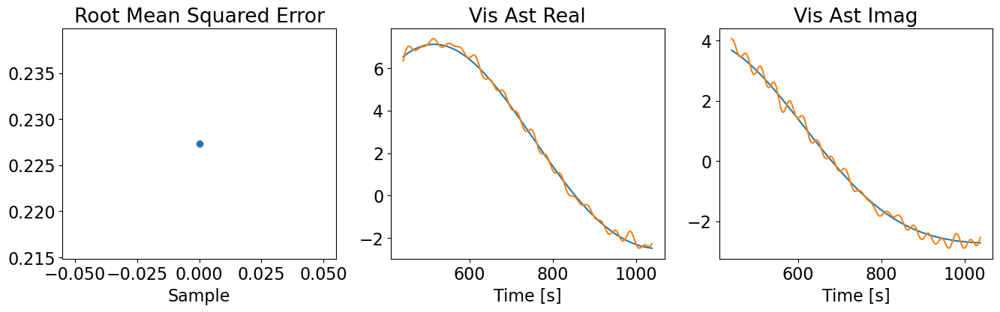

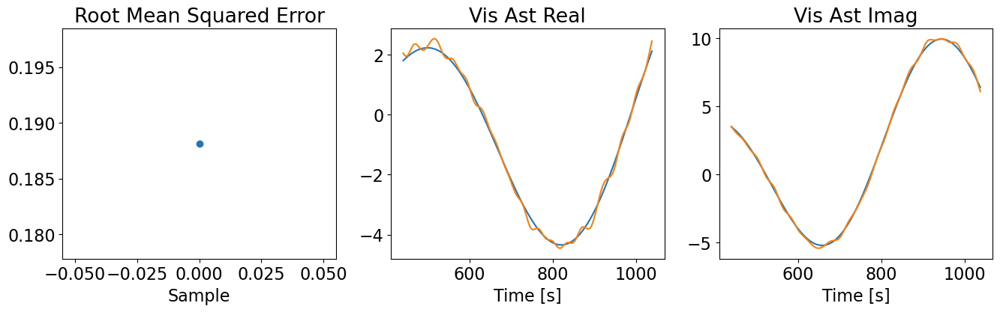

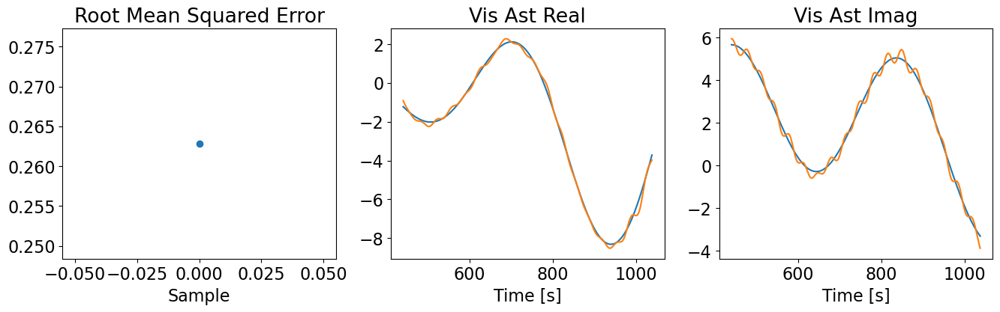

In [410]:
v_ast_pred_m = init_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = init_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = init_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Root Mean Squared Error')
    ax[0].plot(init_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

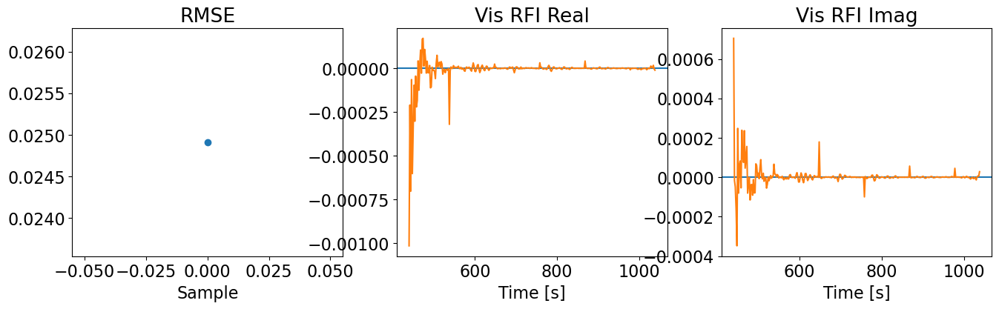

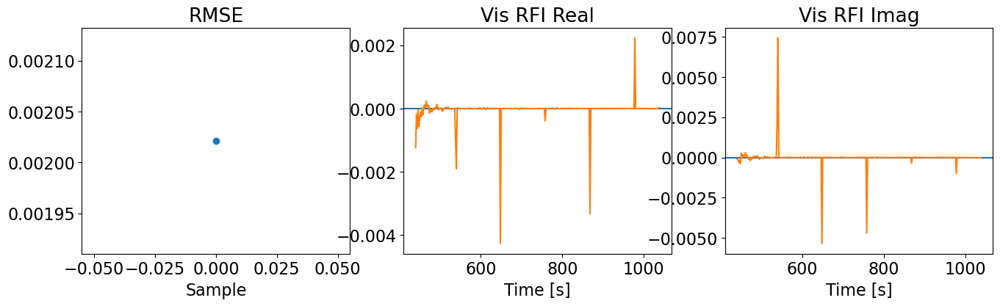

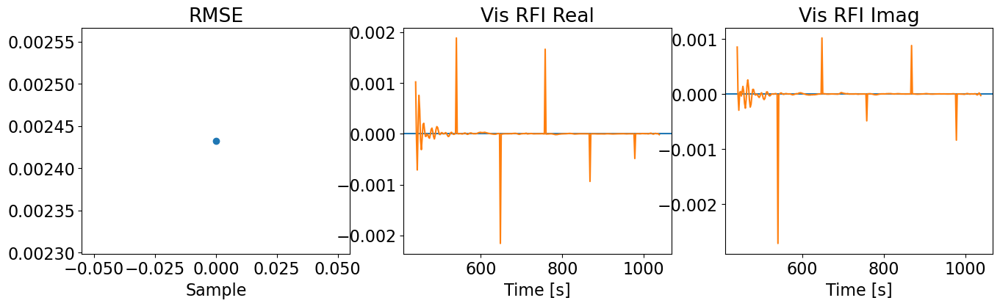

In [34]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = init_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = init_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = init_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('RMSE')
    ax[0].plot(init_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

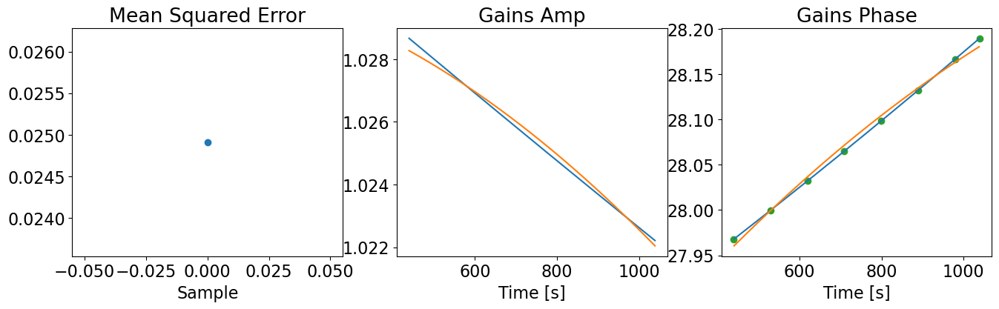

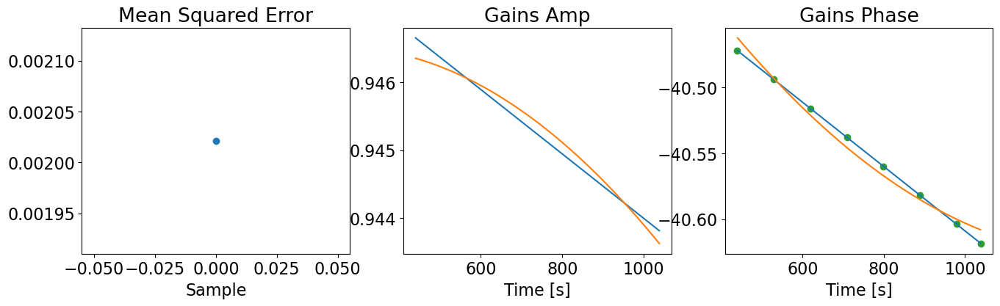

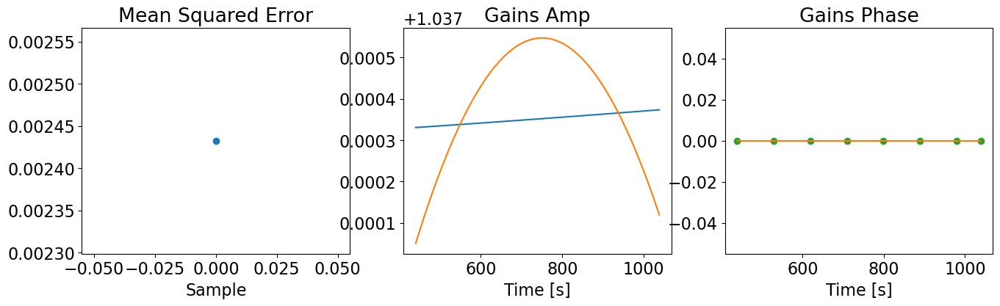

In [35]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = init_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(init_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(init_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(init_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    ax[2].plot(times_g, jnp.rad2deg(jnp.angle(G[bl])), 'o')
    ax[2].set_xlabel('Time [s]')

In [36]:
pred = Predictive(model, num_samples=100)
prior_pred = pred(random.PRNGKey(2), params=params)

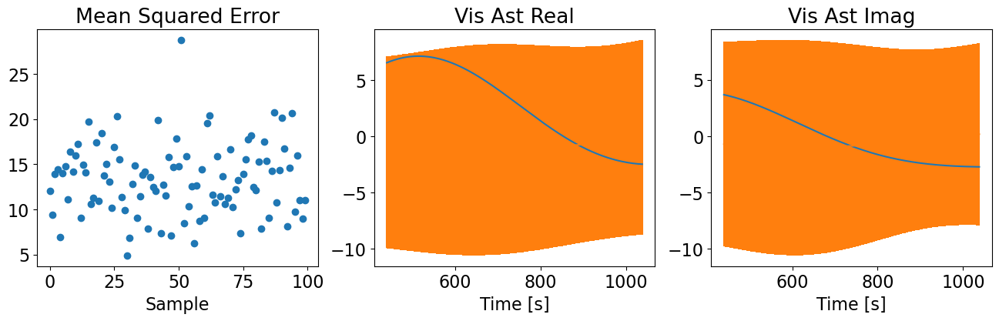

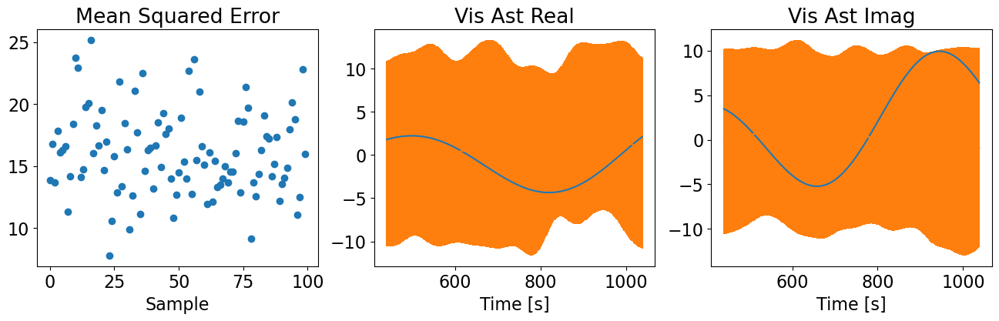

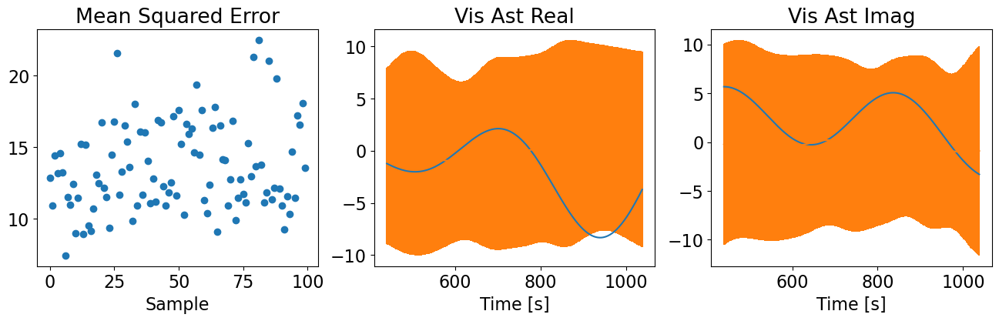

In [37]:
v_ast_pred_m = prior_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = prior_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = prior_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(prior_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

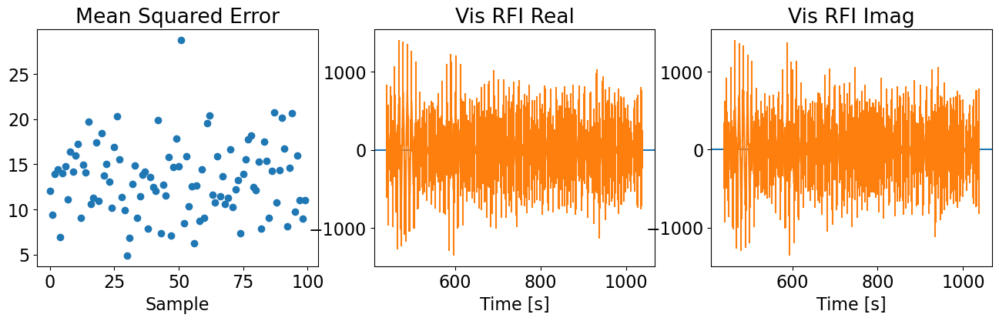

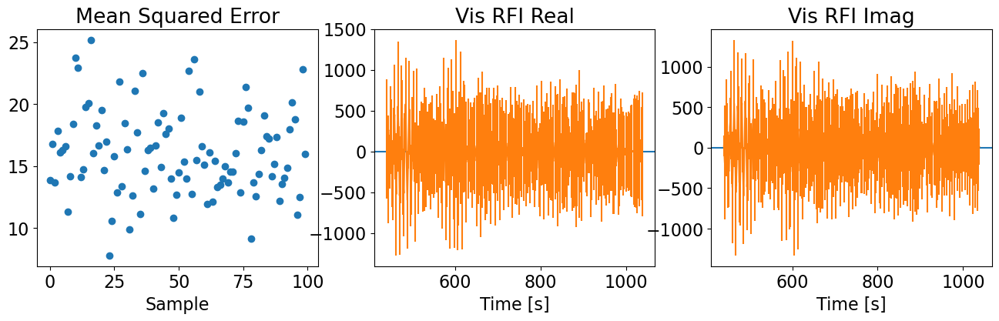

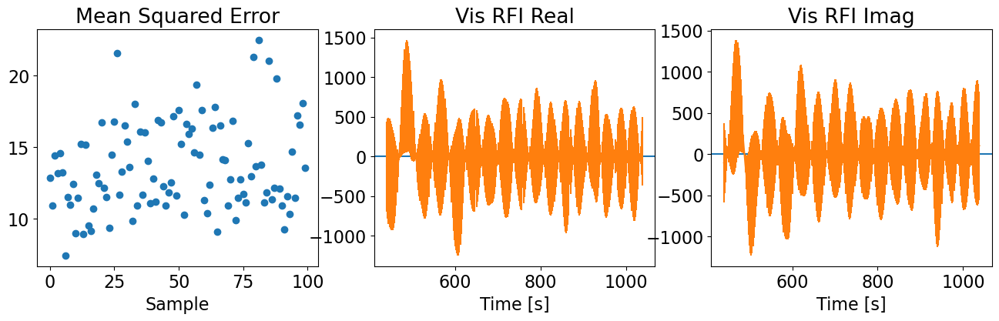

In [38]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = prior_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = prior_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = prior_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(prior_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

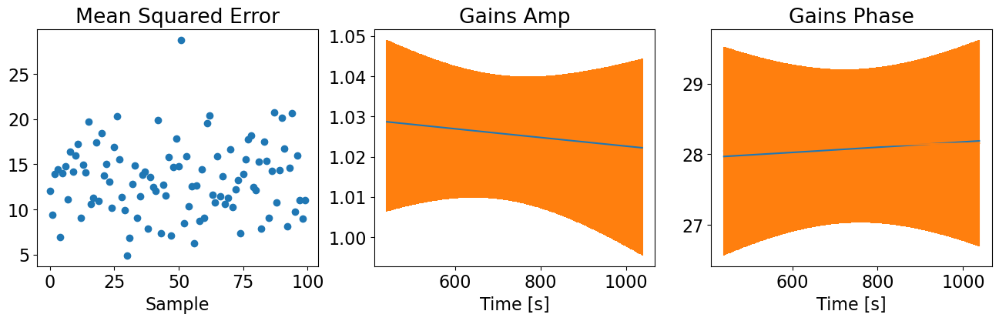

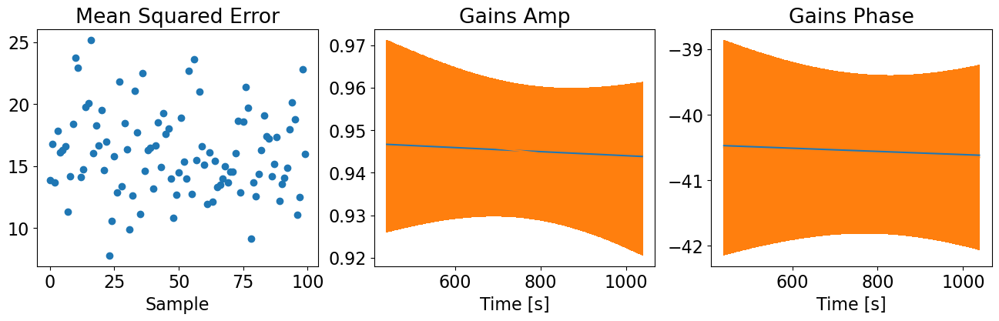

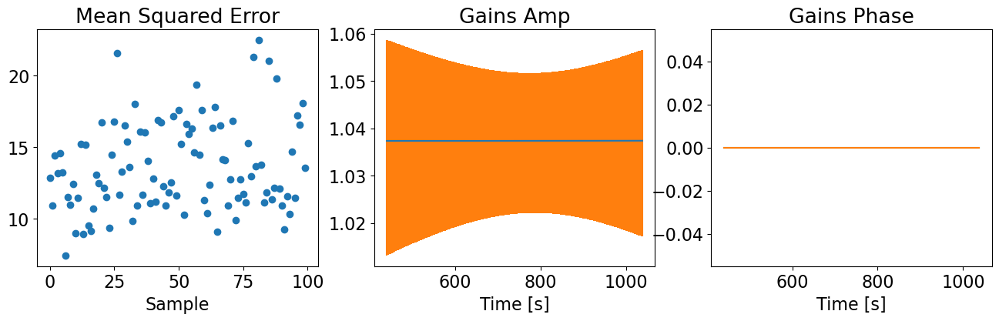

In [39]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = prior_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(prior_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(prior_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(prior_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

In [32]:
flatten(true_params)[0].shape

(1037,)

# MCMC Results

In [41]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.2f}".format(x)})

In [42]:
num_warmup = 500
num_samples = 1000

nuts_kernel = NUTS(model, dense_mass=False)#[('g_phase_0', 'g_phase_1')])
mcmc = MCMC(nuts_kernel, num_warmup=num_warmup, num_samples=num_samples)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, params, extra_fields=('potential_energy',), init_params=true_params)

warmup:   5%|██████▍                                                                                                                                    | 70/1500 [00:49<16:46,  1.42it/s, 1023 steps of size 1.50e-04. acc. prob=0.72]


KeyboardInterrupt: 

In [211]:
# mcmc.print_summary()

In [212]:
pred = Predictive(model, mcmc.get_samples())
vi_pred = pred(random.PRNGKey(2), params)

Text(0.5, 0, 'Sample Number')

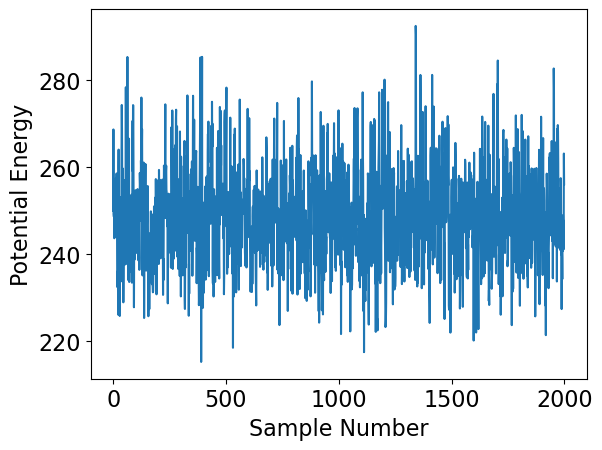

In [213]:
plt.plot(mcmc.get_extra_fields()['potential_energy'][:])
plt.ylabel('Potential Energy')
plt.xlabel('Sample Number')

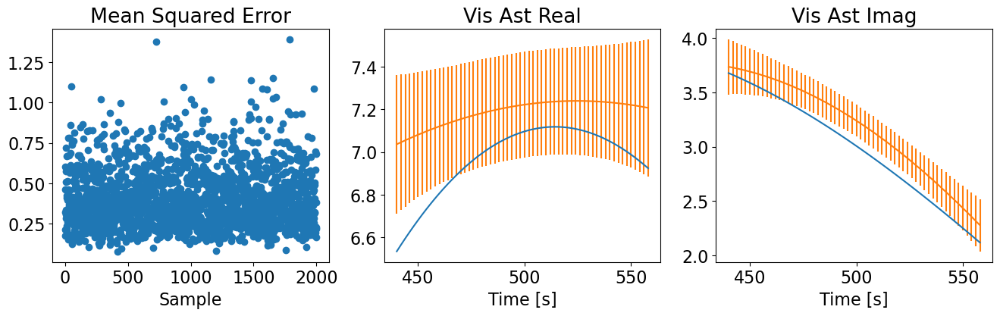

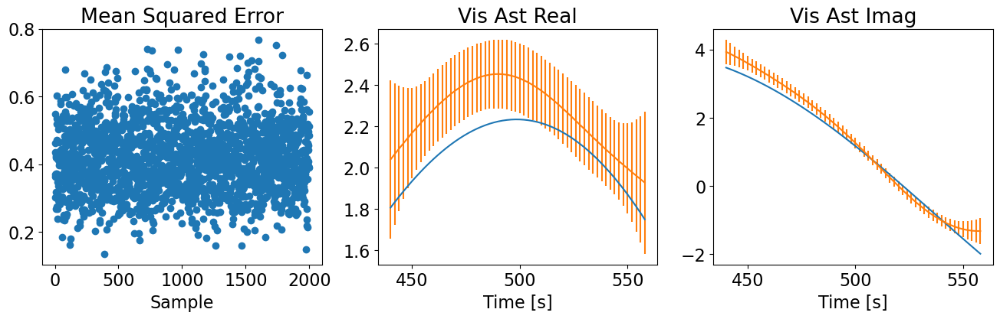

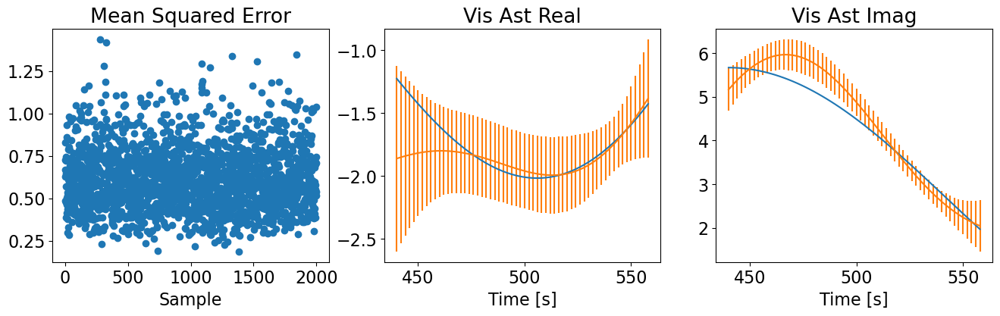

In [214]:
v_ast_pred_m = vi_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = vi_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = vi_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(vi_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

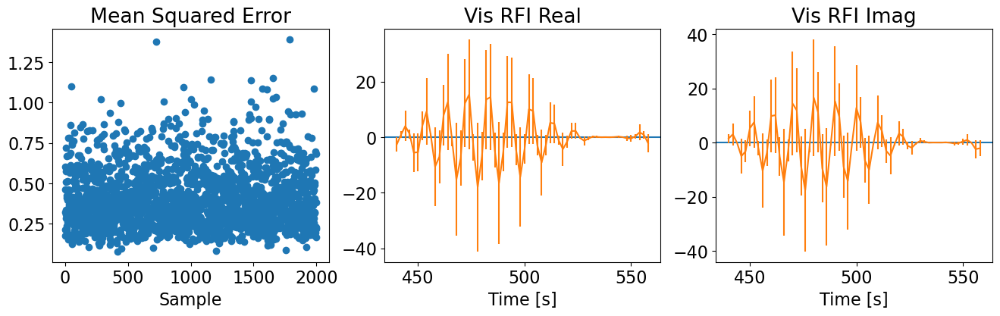

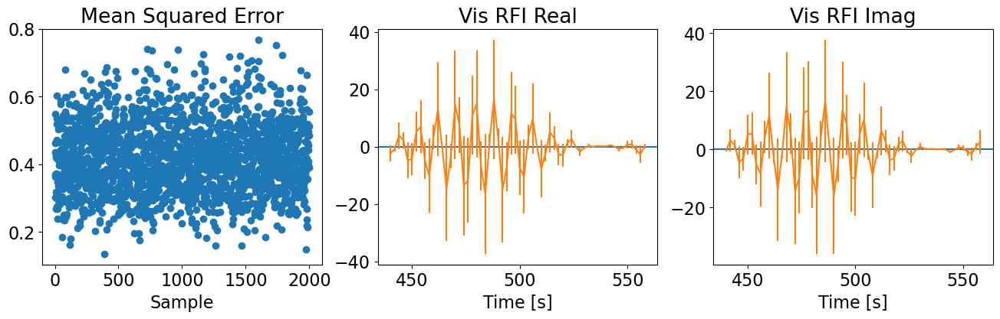

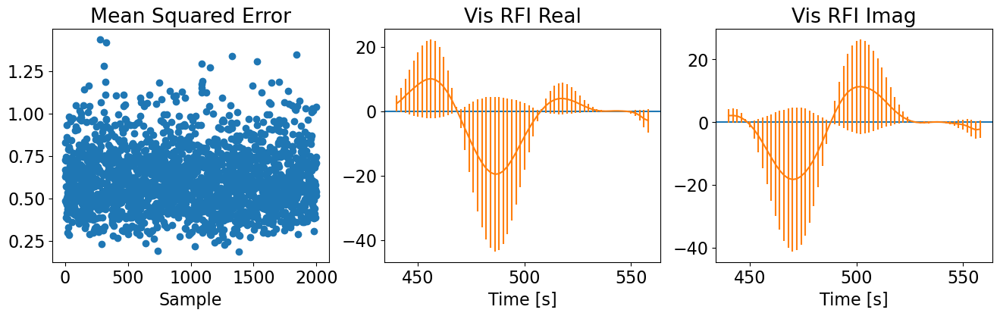

In [215]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = vi_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = vi_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = vi_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(vi_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

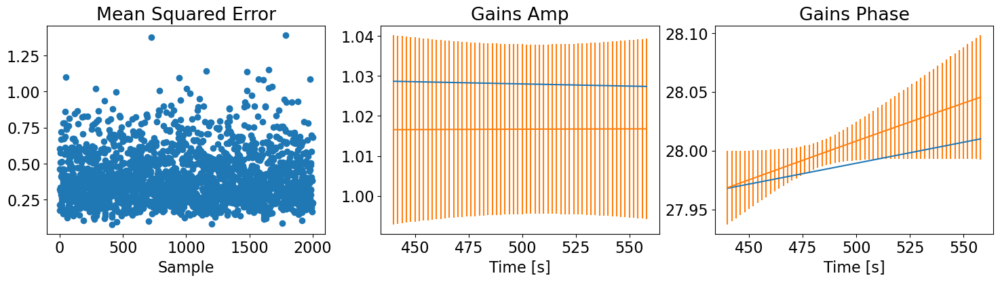

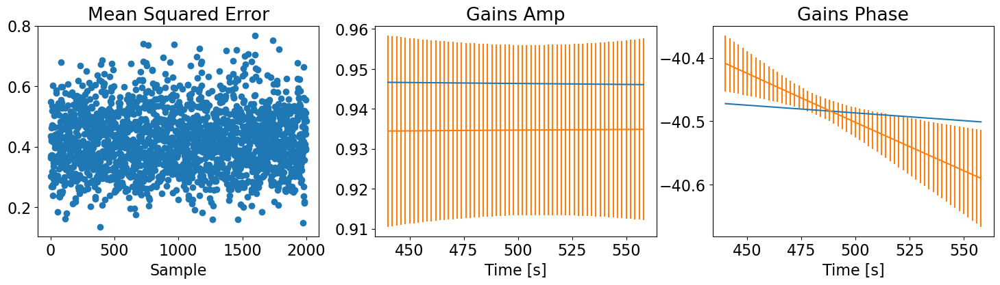

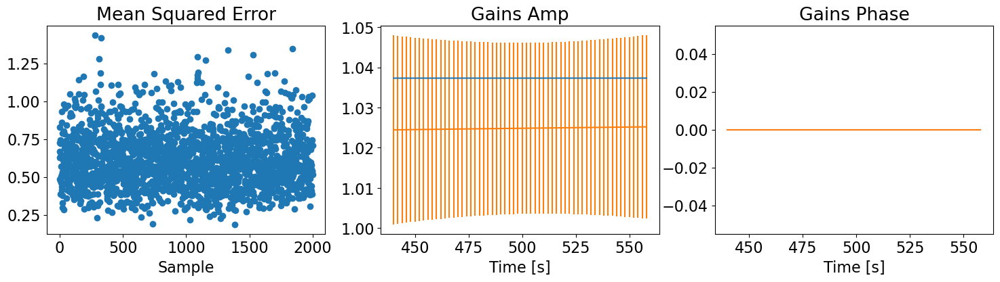

In [216]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = vi_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(vi_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(vi_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(18, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(vi_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

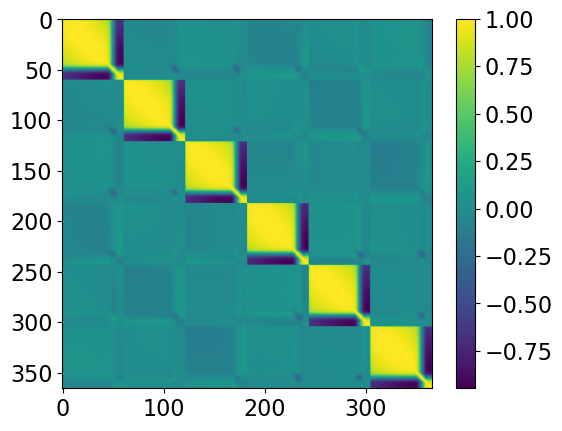

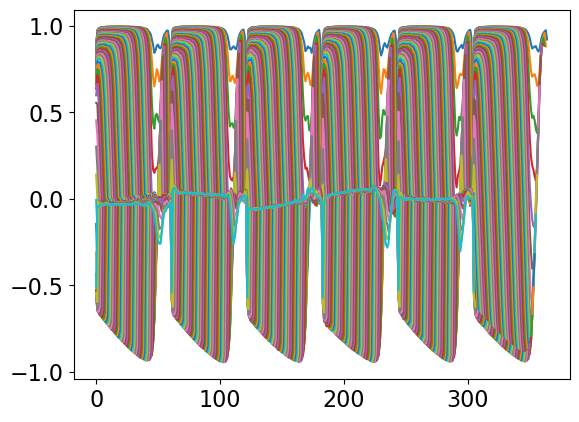

In [224]:
cov = jnp.cov(mcmc.get_samples()['rfi_amp'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, N_rfi_time):
    plt.plot(jnp.diag(corr, i))

[[1.00 -0.11 -0.02 0.11 0.02 -0.04 -0.06 -0.12 -0.13]
 [-0.11 1.00 -0.02 0.14 -0.06 0.00 0.07 -0.08 -0.06]
 [-0.02 -0.02 1.00 0.15 -0.07 -0.08 0.05 -0.03 -0.07]
 [0.11 0.14 0.15 1.00 -0.32 -0.27 -0.07 -0.07 -0.04]
 [0.02 -0.06 -0.07 -0.32 1.00 -0.19 -0.11 -0.07 -0.08]
 [-0.04 0.00 -0.08 -0.27 -0.19 1.00 -0.02 -0.04 0.02]
 [-0.06 0.07 0.05 -0.07 -0.11 -0.02 1.00 -0.07 0.10]
 [-0.12 -0.08 -0.03 -0.07 -0.07 -0.04 -0.07 1.00 0.11]
 [-0.13 -0.06 -0.07 -0.04 -0.08 0.02 0.10 0.11 1.00]]


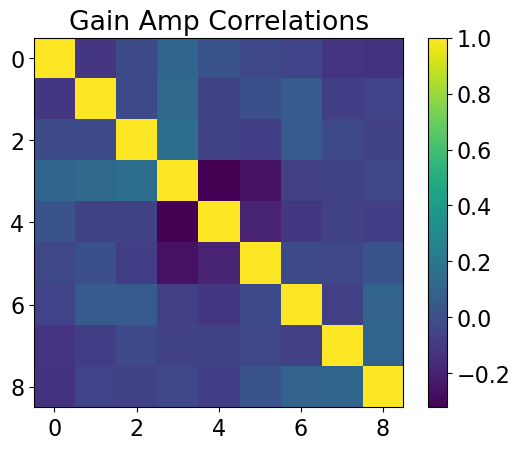

In [277]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'g_amp_{i}']for i in range(N_ant)], axis=-1).reshape(-1, N_ant*N_g_time).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Gain Amp Correlations')
plt.imshow(corr)
plt.colorbar()

print(corr)

[[1.00 -0.14 -0.02 0.25 0.16 0.10]
 [-0.14 1.00 -0.05 0.07 0.15 0.18]
 [-0.02 -0.05 1.00 0.12 0.16 0.15]
 [0.25 0.07 0.12 1.00 -0.24 -0.31]
 [0.16 0.15 0.16 -0.24 1.00 -0.06]
 [0.10 0.18 0.15 -0.31 -0.06 1.00]]


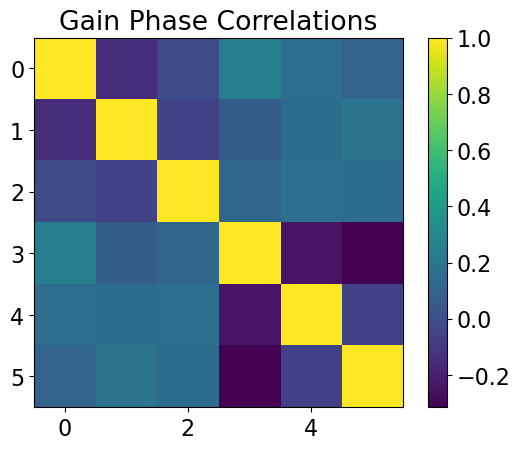

In [278]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'g_phase_{i}']for i in range(N_ant-1)], axis=-1).reshape(-1, N_g_time*(N_ant-1)).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Gain Phase Correlations')
plt.imshow(corr)
plt.colorbar()

print(corr)

[0.61 0.59 0.07 -0.16 0.29 0.28 -0.18 -0.00 -0.10 0.19 -0.49]


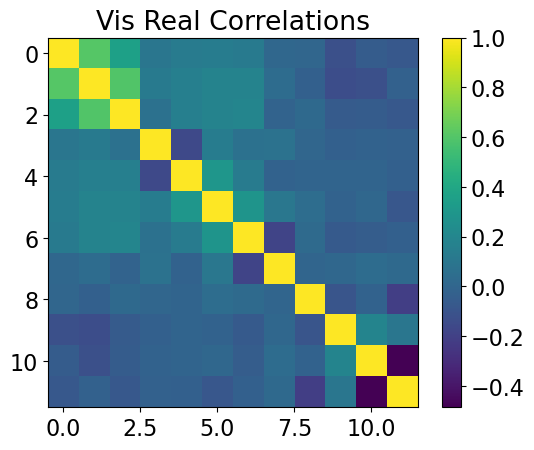

In [228]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'vis_r_{i}']for i in range(N_bl)], axis=-1).reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Vis Real Correlations')
plt.imshow(corr)
plt.colorbar()

print(jnp.diag(corr, 1))

[0.31 0.21 0.01 -0.06 0.19 0.03 -0.25 0.02 -0.13 0.35 -0.33]


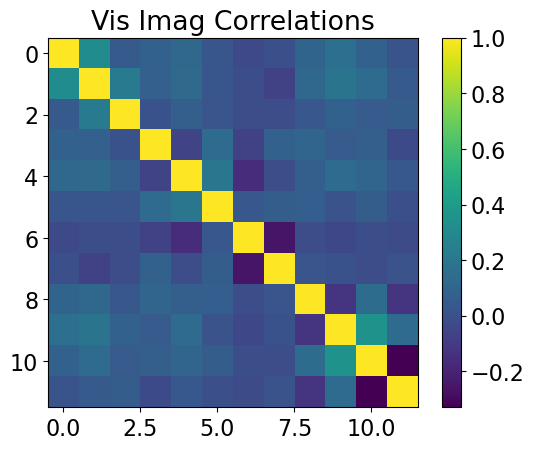

In [230]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'vis_i_{i}']for i in range(N_bl)], axis=-1).reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Vis Imag Correlations')
plt.imshow(corr)
plt.colorbar()

print(jnp.diag(corr, 1))

# Fourier Domain Sampling

In [31]:
@jit
def pow_spec(k, P0=1e7, k0=3e-3, gamma=2):
    return P0 / ((1. + (jnp.abs(k)/k0)**2)**(gamma / 2))

In [63]:
rfi_amp = jnp.abs(vis_rfi)[:,:,0]
rfi_phasor = vis_rfi[:,:,0]/rfi_amp

vis_rfi_true = vis_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

In [32]:
N = N_time*N_int_samples
N_pad = 10*N_int_samples
NN = N + 2*N_pad

dt = jnp.diff(times_fine)[0]
k = jnp.fft.fftfreq(NN, dt)

k_lim = 1e-1
k_idx = jnp.where(jnp.abs(k)<k_lim)[0]
nn = len(k_idx)
k_idx = jnp.concatenate([k_idx[:(nn+1)//2], k_idx[(nn+1)//2+1:]])
k_ = k[k_idx]

nn = len(k_idx)
factor = NN/nn

t_idx = jnp.round(jnp.arange(0, NN, factor), 0).astype(int)
N_pad_ = int(N_pad/factor)

print(f'# of Fourier modes :   {nn}')
print(f'Memory saving factor : {factor:.1f}')

pad = partial(jnp.pad, pad_width=N_pad, mode='reflect', reflect_type='odd')

rfi_amp_pad = vmap(pad)(rfi_A_app[:,:,0].T).T
# rfi_amp_pad = vmap(pad)(rfi_amp[:,:].T).T
rfi_k = jnp.fft.fft(rfi_amp_pad, axis=0)/factor
rfi_k_ = rfi_k[k_idx]

# of Fourier modes :   126
Memory saving factor : 325.1


In [33]:
print(f'RFI Parameter Ratio : {nn*2/N_rfi_time:.2f}')

RFI Parameter Ratio : 0.84


In [34]:
NN*rfi_amp_pad.mean()

Array(56731.2517998, dtype=float64)

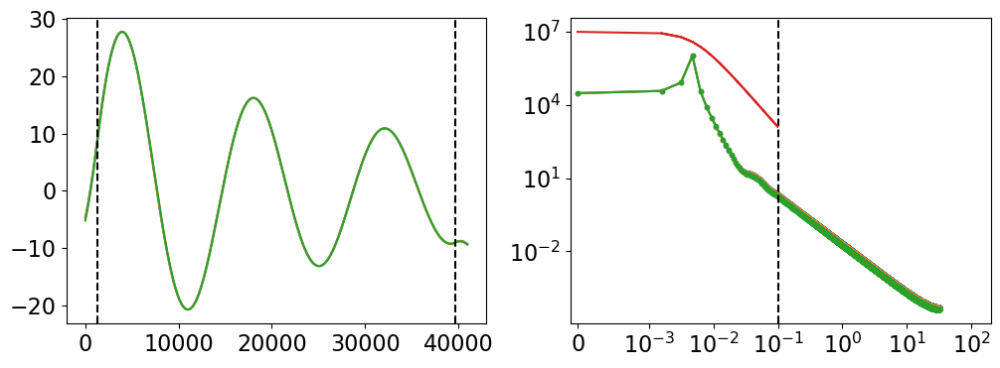

In [35]:
fig, ax = plt.subplots(1, 2, figsize=(12, 4))

ax[0].plot(rfi_amp_pad)
ax[0].axvline(N_pad, color='k', ls='--')
ax[0].axvline(NN-N_pad, color='k', ls='--')

ax[1].plot(k[:NN//2], jnp.abs(rfi_k[:NN//2])**2, '.-')
ax[1].set_yscale('log')
ax[1].set_xscale('symlog', linthresh=1e-3)
ax[1].set_xlim(-1e-4, 2e2)
ax[1].axvline(k_lim, color='k', ls='--')

ax[1].plot(jnp.abs(k_), pow_spec(k_, P0=1e7, k0=5e-3, gamma=3))

/Users/chrisfinlay/mambaforge/envs/tabascal/lib/python3.8/site-packages/jax/_src/array.py:349: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(self._value, dtype=dtype)


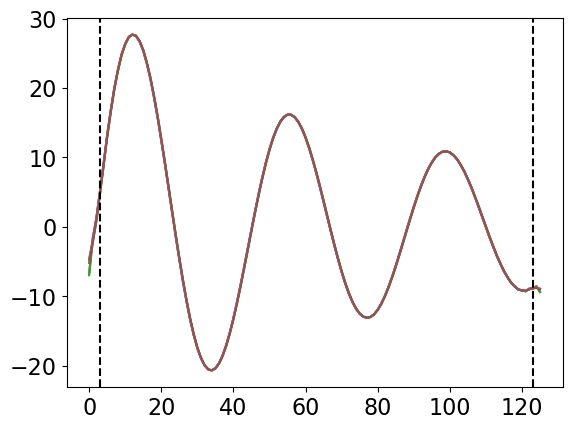

In [36]:
fig, ax = plt.subplots(1,1)
ax = [ax,]

ax[0].plot(jnp.fft.ifft(rfi_k[k_idx,:], axis=0))
ax[0].plot(rfi_amp_pad[t_idx,:])

ax[0].axvline(N_pad_, color='k', ls='--')
ax[0].axvline(nn-N_pad_, color='k', ls='--')

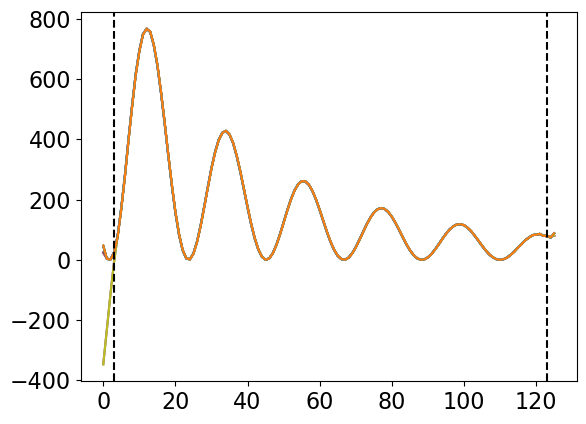

In [39]:
fig, ax = plt.subplots(1,1)
ax = [ax,]

rfi_I_ = jnp.fft.ifft(rfi_k[k_idx,:][:,a1], axis=0)*jnp.fft.ifft(rfi_k[k_idx,:][:,a2], axis=0)
rfi_kI_ = jnp.fft.fft(rfi_I_, axis=0)
rfi_I = vmap(pad)(rfi_amp.T).T

ax[0].plot(rfi_I_)
ax[0].plot(rfi_amp_pad[t_idx,:][:,a1]*rfi_amp_pad[t_idx,:][:,a2])
ax[0].plot(rfi_I[t_idx])
ax[0].plot(jnp.fft.ifft(rfi_kI_, axis=0))
# ax[0].set_ylim(0, 1000)

ax[0].axvline(N_pad_, color='k', ls='--')
ax[0].axvline(nn-N_pad_, color='k', ls='--')

In [134]:
# @jit
def averaging(x, n_avg):
    shape = x.shape
    n = shape[0]//n_avg
    x_avg = jnp.mean(jnp.reshape(x, newshape=(n, n_avg, *shape[1:])), axis=1)
    return x_avg

# @jit
def fft_inv_even(X, n_pad, n_out):
    n_k = len(X)
    n_k_missing = n_out - n_k
    factor = n_out/n_k
    # assert n_k%2 == 0
    X_ = X*factor
    X_ = jnp.concatenate([X_[:n_k//2], jnp.zeros(n_k_missing), X_[n_k//2:]])            
    x = jnp.fft.ifft(X_)[n_pad:-n_pad]
    return x

# @jit
def eye(N, idx):
    x = jnp.zeros(N)
    x = x.at[idx].set(1.)
    return x

# @jit
def eye_vmap(N, idx):
    x = vmap(eye, in_axes=(None, 0))(N, idx)
    return x

In [135]:
rfi_k_.shape

(126, 3)

In [136]:
rfi_A_test = fft_inv_even(rfi_k_[:,0], N_pad, NN)

In [137]:
rfi_A_test.shape

(38400,)

In [140]:
rfi_A_test2 = (F_inv@rfi_k_[:,0])

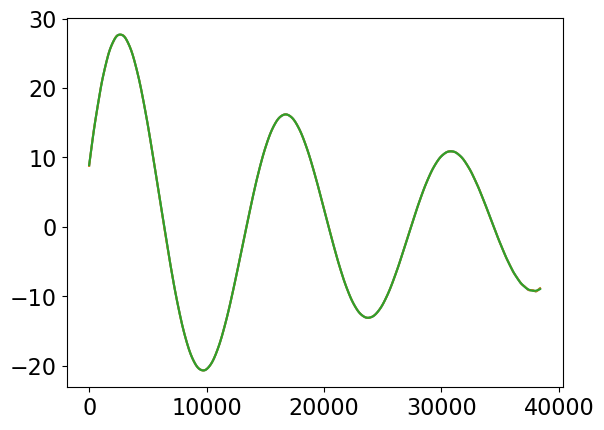

In [141]:
plt.plot(jnp.real(rfi_A_test))
plt.plot(jnp.real(rfi_A_test2))
plt.plot(rfi_A_app[:,0,0])

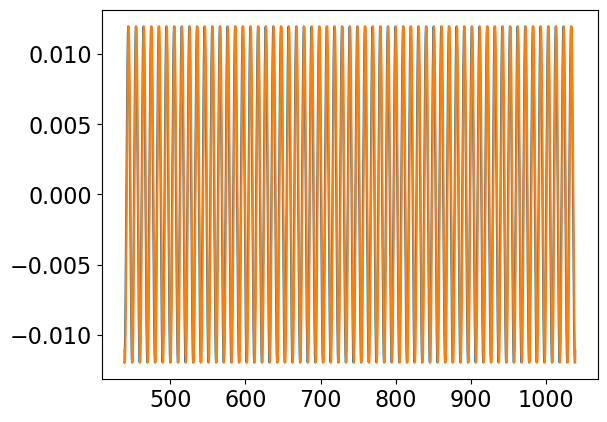

In [145]:
plt.plot(times_fine, jnp.imag(rfi_A_test))
plt.plot(times_fine, jnp.imag(rfi_A_test2))
# plt.plot(rfi_A_app[:,0,0])

In [147]:
rfi_k_.shape

(126, 3)

In [157]:
@jit
def get_rfi_vis1(rfi_k, a1, a2, rfi_k_kernel):
    rfi_I = jnp.fft.ifft(rfi_k[:,a1], axis=0) * jnp.fft.ifft(rfi_k[:,a2], axis=0)
    rfi_kI = jnp.fft.fft(rfi_I, axis=0)
    
    rfi_vis = (rfi_k_kernel*rfi_kI).sum(axis=1).T
    
    return rfi_vis

In [191]:
rfi_k_.shape

(126, 3)

In [200]:
@jit
def get_rfi_vis2(rfi_k, a1, a2, rfi_phasor):
    rfi_amp = vmap(fft_inv_even, in_axes=(1,None,None))(rfi_k, N_pad, NN).T
    rfi_I = rfi_amp[:,a1]*rfi_amp[:,a2]
    rfi_vis = averaging(rfi_I*rfi_phasor, N_int_samples)
    
    return rfi_vis

In [158]:
%timeit get_rfi_vis1(rfi_k_, a1, a2, rfi_k_kernel)

131 µs ± 1.09 µs per loop (mean ± std. dev. of 7 runs, 10,000 loops each)


In [202]:
%timeit get_rfi_vis2(rfi_k_, a1, a2, rfi_phasor)

1.26 ms ± 8.75 µs per loop (mean ± std. dev. of 7 runs, 1,000 loops each)


In [143]:
rfi_k_kernel.shape

(300, 126, 3)

In [415]:
rfi_phasor.shape

(38400, 3)

In [440]:
rfi_phasor2 = jnp.exp(1.j*jnp.unwrap(2*jnp.arctan(vis_rfi.imag/vis_rfi.real)[:,:,0], axis=0)/2)

rfi_amp2 = vis_rfi[:,:,0]/rfi_phasor2

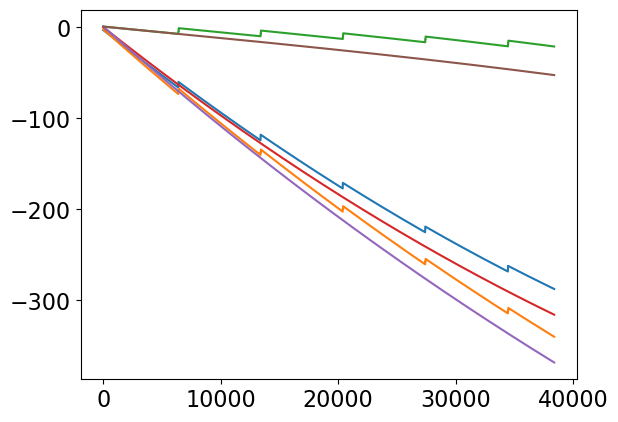

In [439]:
plt.plot(jnp.unwrap(jnp.angle(rfi_phasor), axis=0))
plt.plot(jnp.unwrap(jnp.angle(rfi_phasor2), axis=0)/2)

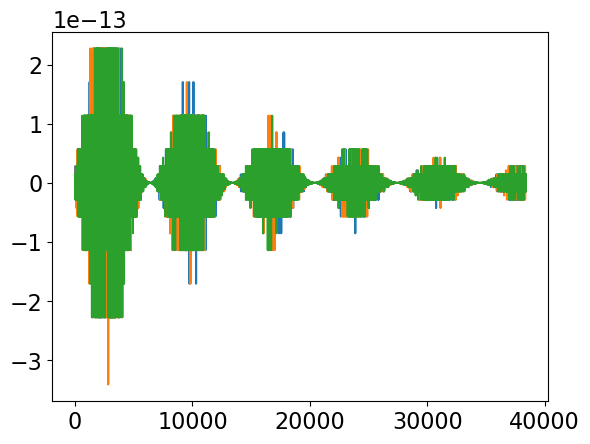

In [453]:
plt.plot(jnp.abs(rfi_amp2)-rfi_amp)
# plt.plot(jnp.real(rfi_amp2))
# plt.plot()

In [66]:
F = jnp.fft.fft(eye_vmap(NN, k_idx))
F_inv = jnp.conjugate(F).T[N_pad:-N_pad]/nn

rfi_k_kernel = jnp.transpose(vmap(averaging, in_axes=(0, None))(rfi_phasor.T[:,:,None]*F_inv[None,:,:], N_int_samples), (1,2,0))

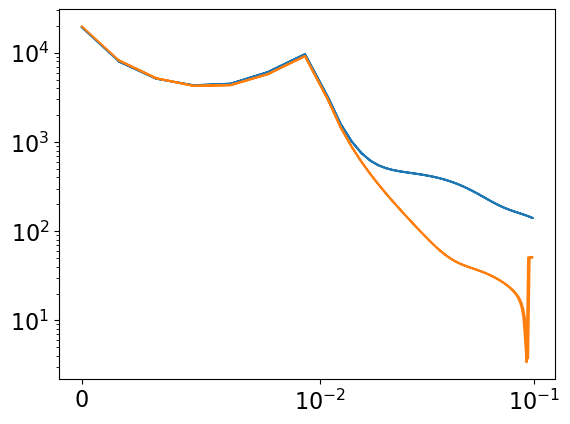

In [67]:
plt.loglog(jnp.abs(k_), jnp.abs((F@rfi_I))[:,0]/factor)
plt.loglog(jnp.abs(k_), jnp.abs(rfi_kI_)[:,0])
plt.xscale('symlog', linthresh=1e-2)

/Users/chrisfinlay/mambaforge/envs/tabascal/lib/python3.8/site-packages/jax/_src/array.py:349: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(self._value, dtype=dtype)


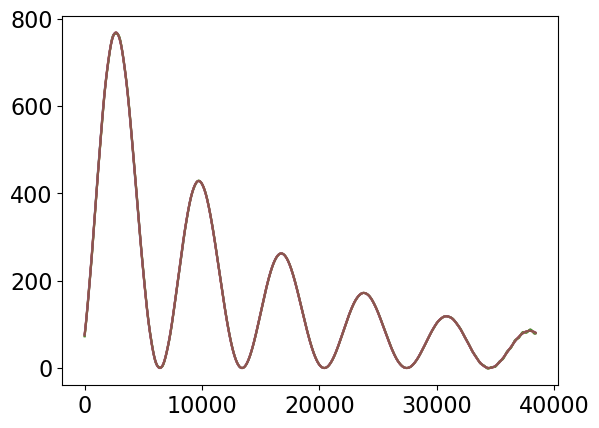

In [68]:
plt.plot(F_inv@rfi_kI_)
plt.plot(rfi_amp)

In [73]:
vis_rfi_test = (rfi_k_kernel*rfi_kI_[None,:,:]).sum(axis=1)

rel_rmse = jnp.sqrt(jnp.mean( jnp.abs(vis_rfi_test/vis_rfi_true - 1)**2 ))

print('Assuming an orbit and compressing all resampling and phase multiplication and averaging into a single matrix')
print('-----------------------------------------------------')
print(f'Relative Root Mean Squared Error : {rel_rmse: .2E}')

Assuming an orbit and compressing all resampling and phase multiplication and averaging into a single matrix
-----------------------------------------------------
Relative Root Mean Squared Error :  6.60E-01


In [74]:
vis_rfi_test.shape

(300, 3)

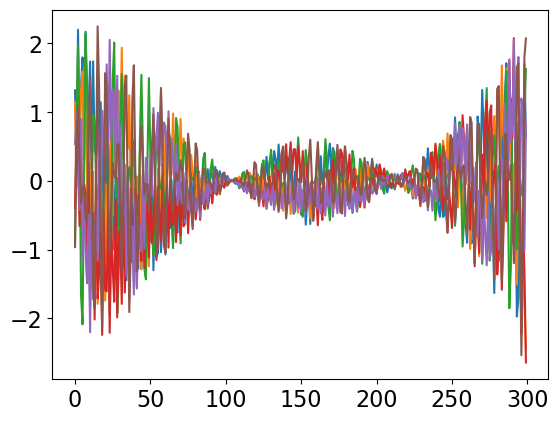

In [75]:
plt.plot(jnp.real(vis_rfi_test-vis_rfi_true))
plt.plot(jnp.imag(vis_rfi_test-vis_rfi_true))

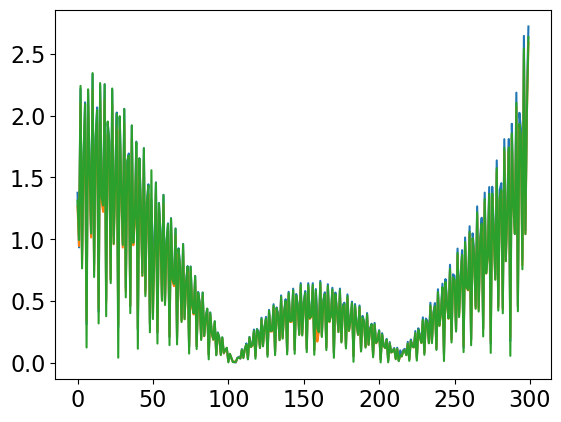

In [76]:
plt.plot(jnp.abs(vis_rfi_test-vis_rfi_true))
# plt.plot(jnp.rad2deg(jnp.angle(vis_rfi_test-vis_rfi_true)))

In [454]:
vis_ast_true = averaging(vis_ast[:,:,0], N_int_samples) + 0.5*random.normal(random.PRNGKey(1), (N_time, N_bl), dtype=complex)

NN_ast = 2**10

NN_ast = 2*N_time
N_pad_ast = (NN_ast - N_time) // 2
dt_ast = jnp.diff(times)[0]
k_ast = jnp.fft.fftfreq(NN_ast, dt_ast)

k_lim_ast = 3e-2
k_idx = jnp.where(jnp.abs(k_ast)<k_lim_ast)[0]
nn_ast = len(k_idx)
k_idx = jnp.concatenate([k_idx[:(nn+1)//2], k_idx[(nn+1)//2+1:]])
factor_ast = NN_ast/nn_ast
k_ast_ = k_ast[k_idx]

pad = partial(jnp.pad, pad_width=N_pad_ast, mode='reflect', reflect_type='odd')

ast_k = jnp.fft.fft(vmap(pad)(vis_ast_true.T).T, axis=0)
ast_k_ = ast_k[k_idx]

In [455]:
ast_k_.shape

(70, 3)

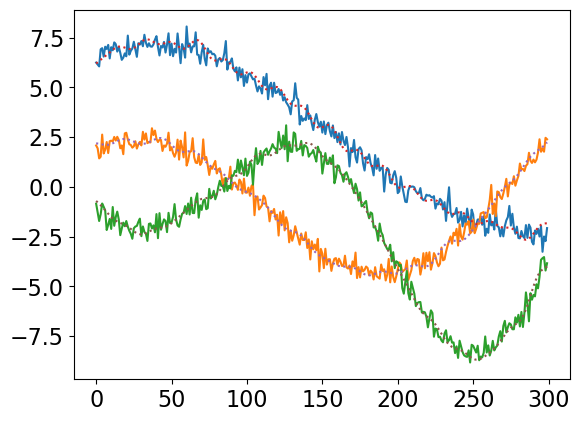

In [456]:
plt.plot(vis_ast_true)
plt.plot(vmap(fft_inv_even, in_axes=(1,None,None))(ast_k_, N_pad_ast, NN_ast).T/factor_ast, ':')

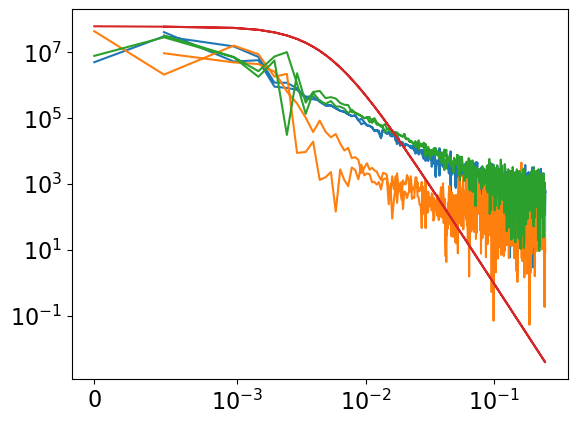

In [318]:
plt.plot(jnp.abs(k_ast), jnp.abs(ast_k)**2)
plt.plot(jnp.abs(k_ast), pow_spec(k_ast, P0=6e7, k0=5e-3, gamma=6))
plt.loglog()
plt.xscale('symlog', linthresh=1e-3)

In [319]:
ast_k.shape

(1024, 3)

In [320]:
def MVN(name, mu, L):
    n = len(mu)
    rv = numpyro.sample(name, 
        dist.TransformedDistribution(dist.Normal(0, jnp.ones(n)), 
                                     [dist.transforms.LowerCholeskyAffine(mu, L),]
                                    )
                       )
    return rv

def Normal(name, mu, sigma):
    rv = numpyro.sample(name, 
        dist.TransformedDistribution(dist.Normal(0, jnp.ones(mu.shape)), 
                                     [dist.transforms.AffineTransform(mu, sigma),]
                                    )
                       )
    return rv

In [369]:
def model(params):
    
    # n_g = params['N_g_times']
    # n_rfi_k = params['N_rfi_k']
    n_time = params['N_time']
    n_ant = params['N_ants']
    n_bl = params['N_bl']
    a1 = params['a1']
    a2 = params['a2']
    k_rfi = params['k_rfi']
    k_ast = params['k_ast']
    dt = params['dt']
    n_rfi_k = len(k_rfi)
    n_ast_k = len(k_ast)
    

    # with numpyro.plate('g_amps', n_ant) as i:
    #     G_amp = numpyro.sample('g_amp', dist.MultivariateNormal(params['mu_G_amp'][i], params['cov_G_amp']))
    
#     with numpyro.plate('g_phases', n_ant-1) as i:
#         G_phase = numpyro.sample(f'g_phase', dist.MultivariateNormal(params['mu_G_phase'][i], params['cov_G_phase']))
    
#     G_amp = jnp.array([MVN(f'g_amp_{i}', params['mu_G_amp'][i], params['L_G_amp']) for i in range(n_ant)])
#     G_phase = jnp.array([MVN(f'g_phase_{i}', params['mu_G_phase'][i], params['L_G_phase']) for i in range(n_ant-1)])# + \
#                         # [numpyro.sample(f'g_phase_{n_ant-1}', dist.Delta(jnp.zeros(len(params['mu_G_phase'][0]))))])
    
#     G_amp = numpyro.deterministic('g_amp', G_amp@params['resample_g_amp'].T)
#     G_phase = numpyro.deterministic('g_phase', jnp.concatenate([G_phase@params['resample_g_phase'].T, jnp.zeros((1,n_time))], axis=0))
        
    G_amp = Normal('g_amp_', params['mu_G_amp'][:,:1], 0.01)
    G_phase = Normal('g_phase_', params['mu_G_phase'][:,:1], jnp.deg2rad(1))
    
    G_amp = numpyro.deterministic('g_amp', G_amp)
    G_phase = numpyro.deterministic('g_phase', jnp.concatenate([G_phase, jnp.zeros((1,1))], axis=0))
    
    G = numpyro.deterministic('gains', G_amp * jnp.exp(1.j*G_phase) * jnp.ones((n_ant, n_time)))
        
    rfi_Pk_root = jnp.sqrt(pow_spec(k_rfi, **params['rfi_Pk_params']))
    
    rfi_k_r = Normal('rfi_k_r', jnp.zeros((n_rfi_k,n_ant)), rfi_Pk_root[:,None]*jnp.ones((n_rfi_k,n_ant)))
    rfi_k_i = Normal('rfi_k_i', jnp.zeros((n_rfi_k,n_ant)), rfi_Pk_root[:,None]*jnp.ones((n_rfi_k,n_ant)))
    
    # rfi_k0 = Normal('rfi_k_0', jnp.zeros((n_rfi_k,n_ant)), rfi_Pk_root[:1,None]*jnp.ones((1,n_ant)))
    
    
    rfi_k = numpyro.deterministic('rfi_k', rfi_k_r + 1.j*rfi_k_i)
    
    rfi_vis = numpyro.deterministic('rfi_vis', get_rfi_vis1(rfi_k, a1, a2, params['rfi_k_kernel']))
    # rfi_vis = numpyro.deterministic('rfi_vis', get_rfi_vis2(rfi_k, a1, a2, params['rfi_phasor']).T)
    
#     rfi_I = numpyro.deterministic('rfi_I', jnp.fft.ifft(rfi_k[:,a1], axis=0)*jnp.fft.ifft(rfi_k[:,a2], axis=0))
#     rfi_kI = numpyro.deterministic('rfi_kI', jnp.fft.fft(rfi_I, axis=0))
        
#     rfi_vis = numpyro.deterministic('rfi_vis', (params['rfi_k_kernel']*rfi_kI).sum(axis=1).T)
    
#     vis_r = [MVN(f'vis_r_{i}', params['mu_vis'][i], params['L_vis'][i]) for i in range(n_bl)]
#     vis_i = [MVN(f'vis_i_{i}', params['mu_vis'][i], params['L_vis'][i]) for i in range(n_bl)]
    
#     vis_r = jnp.array([params['resample_vis'][i]@vis_r[i] for i in range(n_bl)])
#     vis_i = jnp.array([params['resample_vis'][i]@vis_i[i] for i in range(n_bl)])

#     ast_vis = numpyro.deterministic('ast_vis', vis_r + 1.j*vis_i)

    ast_Pk_root = jnp.sqrt(pow_spec(k_ast, **params['rfi_Pk_params']))

    ast_k_r = Normal('ast_k_r', jnp.zeros((n_ast_k,n_bl)), ast_Pk_root[:,None]*jnp.ones((n_ast_k,n_bl)))
    ast_k_i = Normal('ast_k_i', jnp.zeros((n_ast_k,n_bl)), ast_Pk_root[:,None]*jnp.ones((n_ast_k,n_bl)))
    
    ast_k = numpyro.deterministic('ast_k', ast_k_r + 1.j*ast_k_i)
    
    ast_vis = numpyro.deterministic('ast_vis', vmap(fft_inv_even, in_axes=(1,None,None))(ast_k, N_pad_ast, NN_ast)/factor_ast)
    # ast_vis = numpyro.deterministic('ast_vis', jnp.fft.ifft(ast_k, axis=0).T/dt)
    
    vis_obs = numpyro.deterministic('vis_obs', G[a1]*jnp.conjugate(G[a2]) * ( ast_vis + rfi_vis))
    vis_obs = jnp.concatenate([vis_obs.real, vis_obs.imag], axis=1)
    
    numpyro.deterministic('rmse_ast', jnp.sqrt(jnp.mean( jnp.abs( (ast_vis-params['vis_ast_true'])) **2, axis=1)) )
    
    return numpyro.sample('obs', dist.Normal(vis_obs, params['noise']), obs=params['vis_obs'].T)
    

In [370]:
params.update(
    {'k_rfi': k_,
     'rfi_k_kernel': rfi_k_kernel,
     'rfi_phasor': rfi_phasor,
     'k_ast': k_ast_,
     'dt': dt,
     'rfi_Pk_params': {'P0': 1e7, 'k0': 5e-3, 'gamma': 3},
     # 'ast_Pk_params': {'P0': 5e6, 'k0': 3e-3, 'gamma': 2.5},
     'ast_Pk_params': {'P0': 5e6, 'k0': 5e-3, 'gamma': 6},
    }         
     )

In [371]:
true_params = {
    # **{f'g_amp_{i}': true_values['g_amp'][i][:1] for i in range(N_ant)},
    # **{f'g_phase_{i}': true_values['g_phase'][i][:1] for i in range(N_ant-1)},
    **{'g_amp_': jnp.abs(G).mean(axis=1)[:,None]},
    **{'g_phase_': jnp.angle(G).mean(axis=1)[:N_ant-1,None]},
    # **{'rfi_amp': jnp.array([true_values['rfi_amp'][i] for i in range(N_ant)])},
    **{'rfi_k_r': rfi_k_.real},
    **{'rfi_k_i': rfi_k_.imag},
    # **{f'vis_r_{i}': true_values['v_real'][i] for i in range(N_bl)},
    # **{f'vis_i_{i}': true_values['v_imag'][i] for i in range(N_bl)},
    **{'ast_k_r': ast_k_.real},
    **{'ast_k_i': ast_k_.imag},
    }

In [372]:
pred = Predictive(model, tree_map(lambda x: x[None,:], true_params))
init_pred = pred(random.PRNGKey(2), params=params)

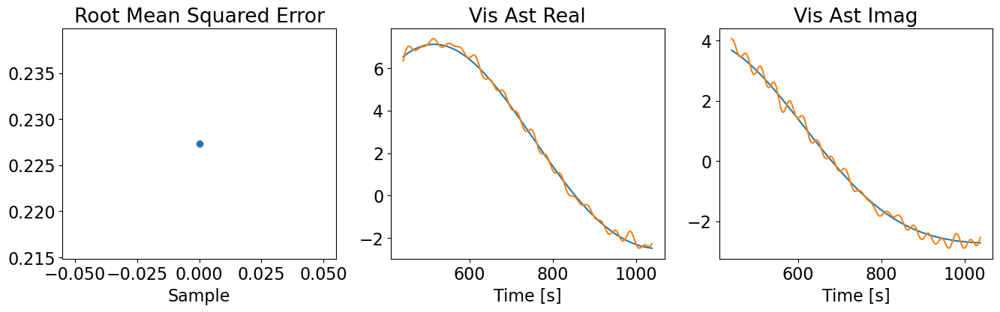

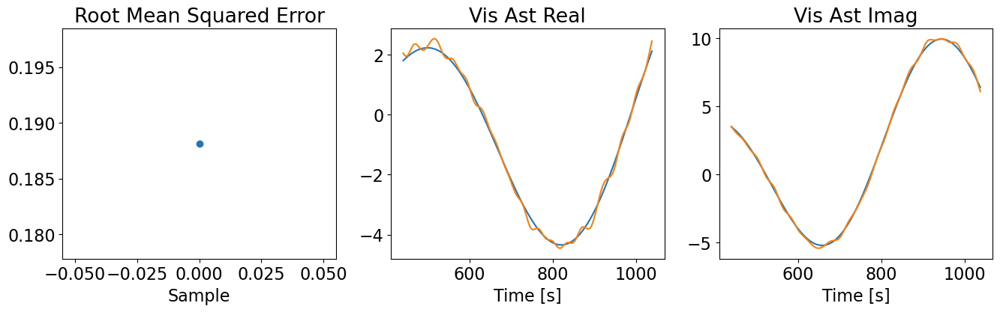

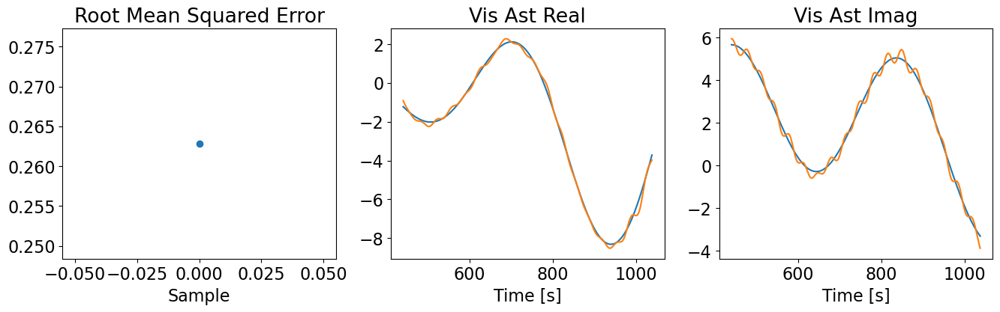

In [373]:
v_ast_pred_m = init_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = init_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = init_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Root Mean Squared Error')
    ax[0].plot(init_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

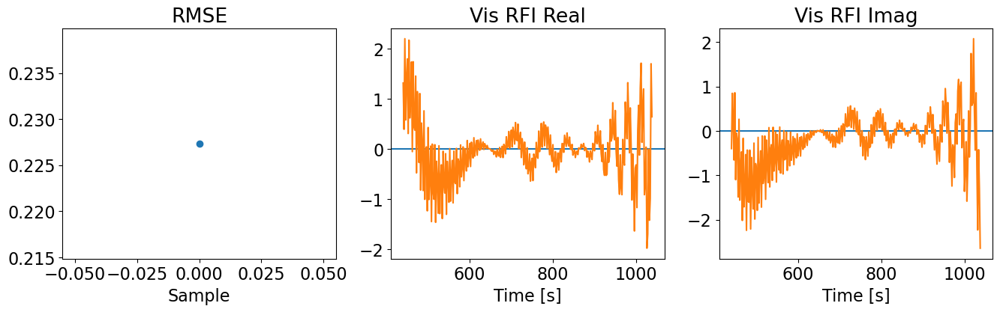

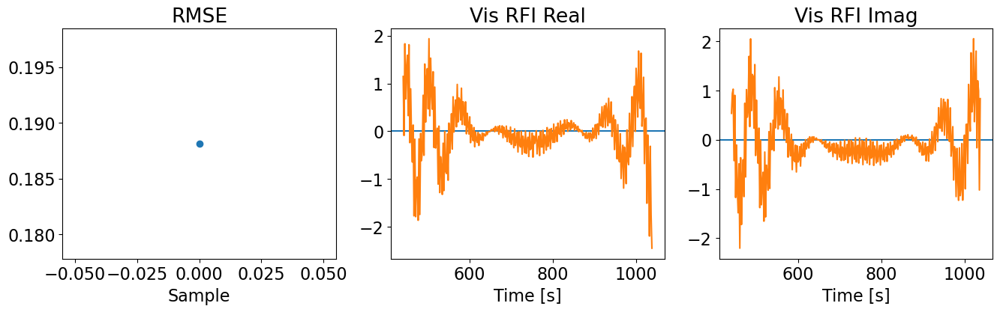

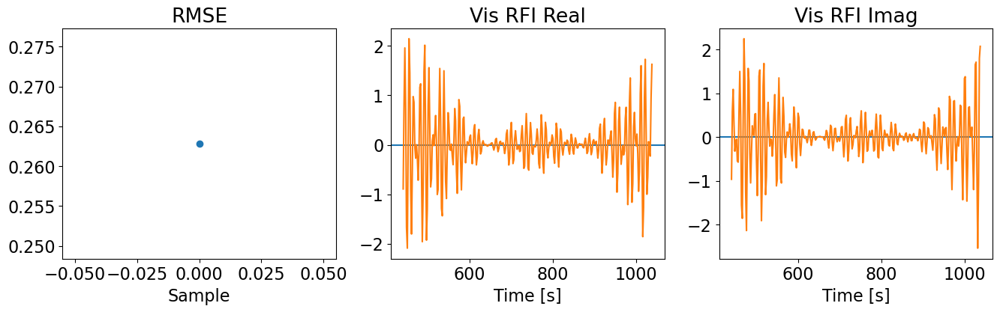

In [374]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = init_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = init_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = init_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('RMSE')
    ax[0].plot(init_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

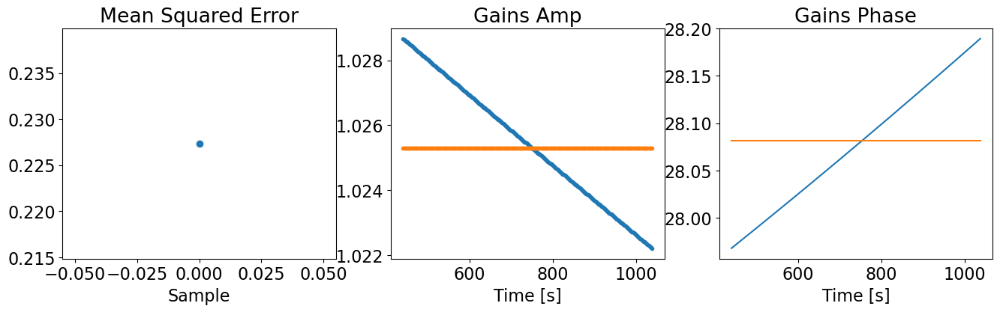

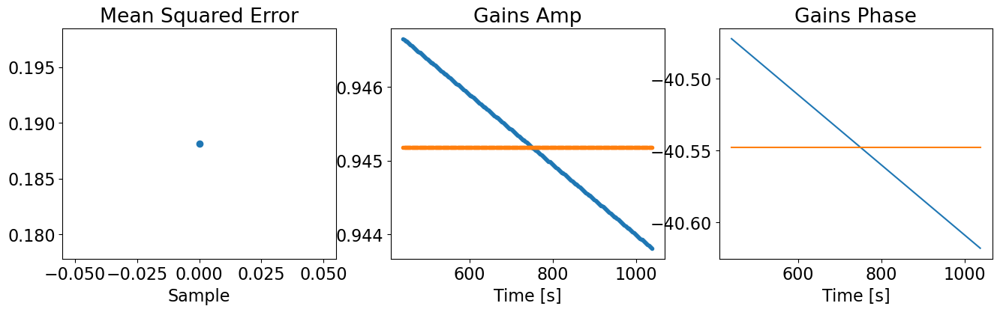

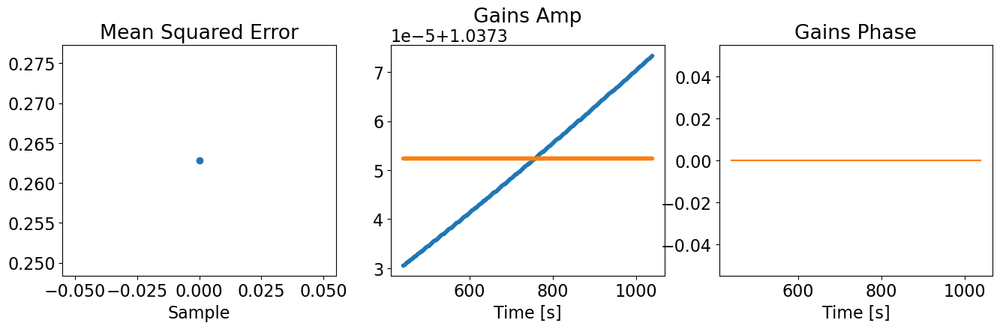

In [375]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = init_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(init_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(init_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(init_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), fmt='.', label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], fmt='.', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    # ax[2].plot(times_g, jnp.rad2deg(jnp.angle(G[bl])), 'o')
    ax[2].set_xlabel('Time [s]')

In [376]:
pred = Predictive(model, num_samples=100)
prior_pred = pred(random.PRNGKey(2), params=params)

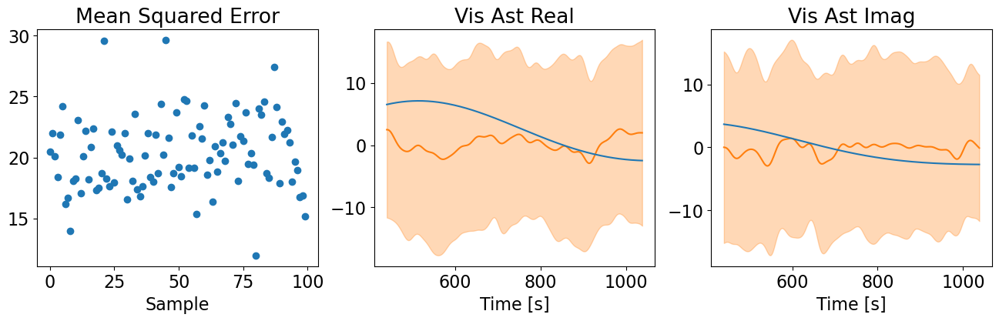

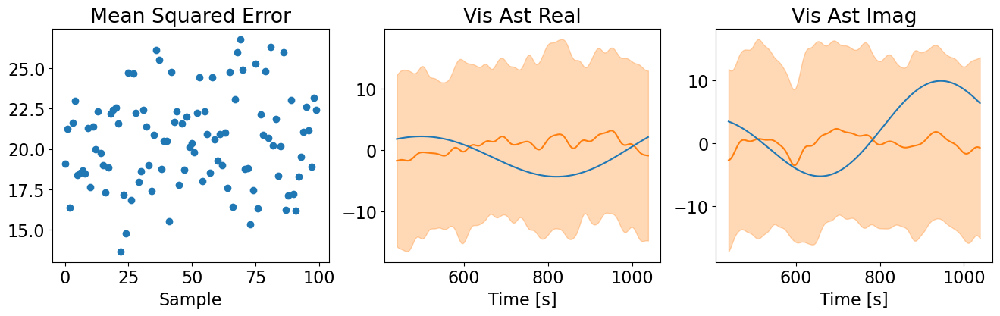

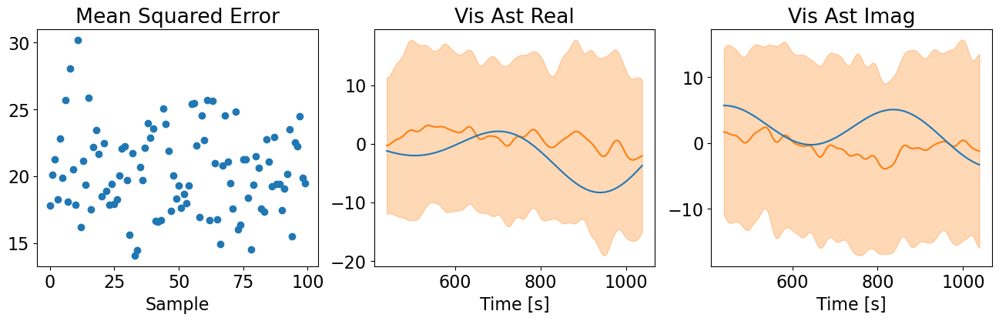

In [399]:
v_ast_pred_m = prior_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = prior_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = prior_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(prior_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    # ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].plot(times_, v_ast_pred_m[bl].real, color='tab:orange')
    ax[1].fill_between(times_, v_ast_pred_m[bl].real-v_ast_pred_sr[bl], 
                       v_ast_pred_m[bl].real+v_ast_pred_sr[bl], color='tab:orange', alpha=0.3)
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    # ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].plot(times_, v_ast_pred_m[bl].imag, color='tab:orange')
    ax[2].fill_between(times_, v_ast_pred_m[bl].imag-v_ast_pred_si[bl], 
                       v_ast_pred_m[bl].imag+v_ast_pred_si[bl], color='tab:orange', alpha=0.3)
    ax[2].set_xlabel('Time [s]')

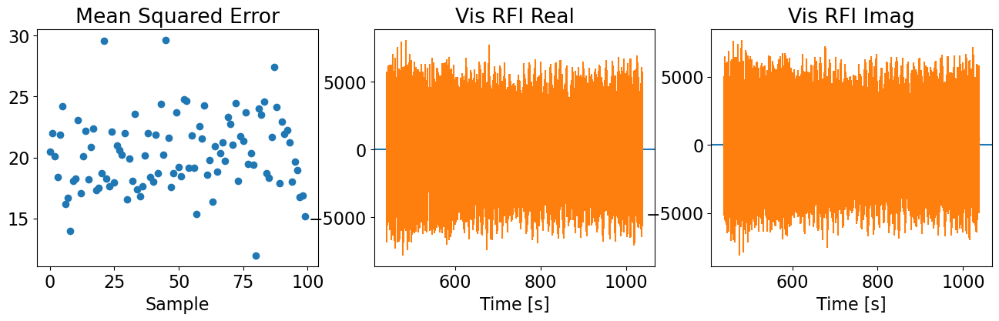

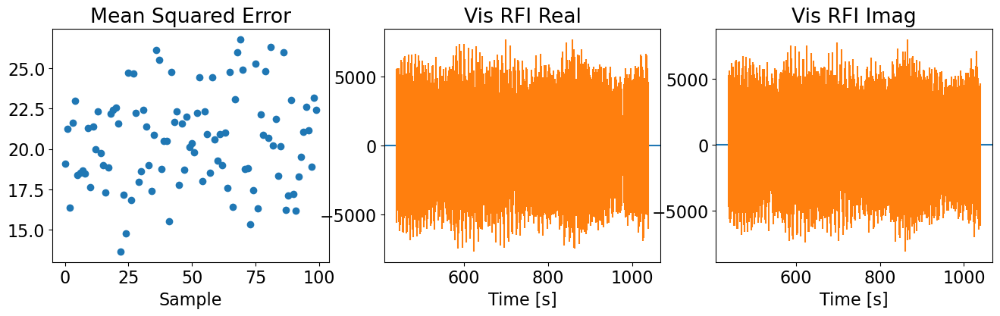

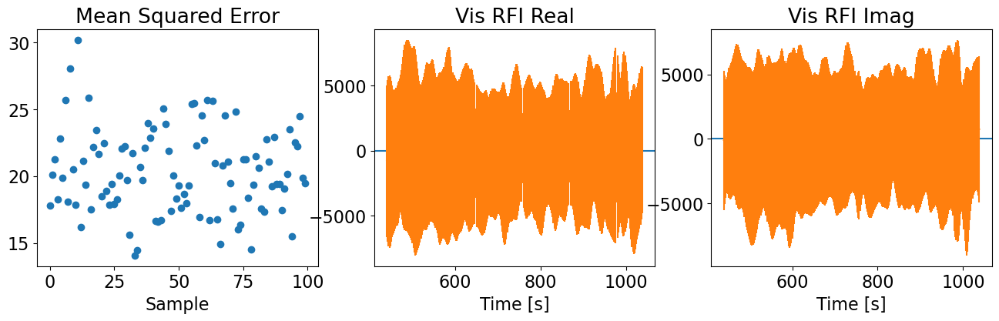

In [378]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = prior_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = prior_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = prior_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(prior_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

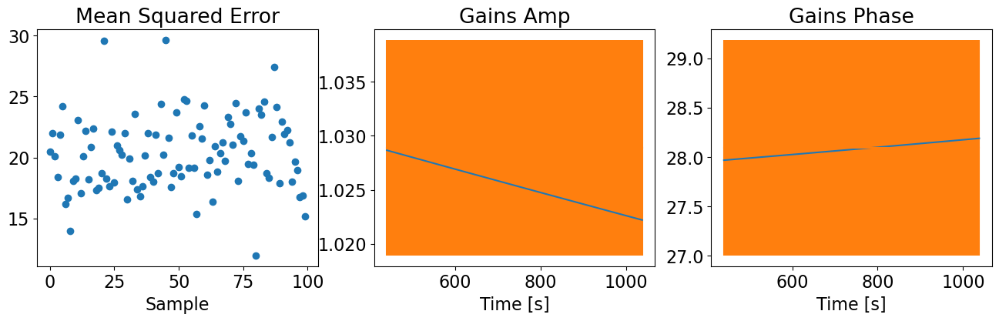

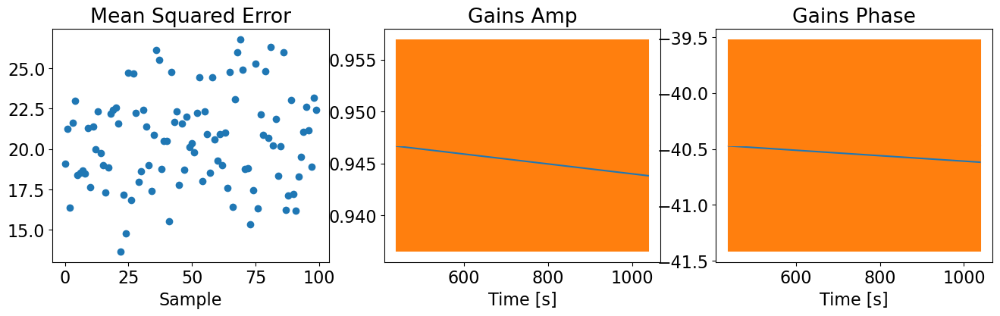

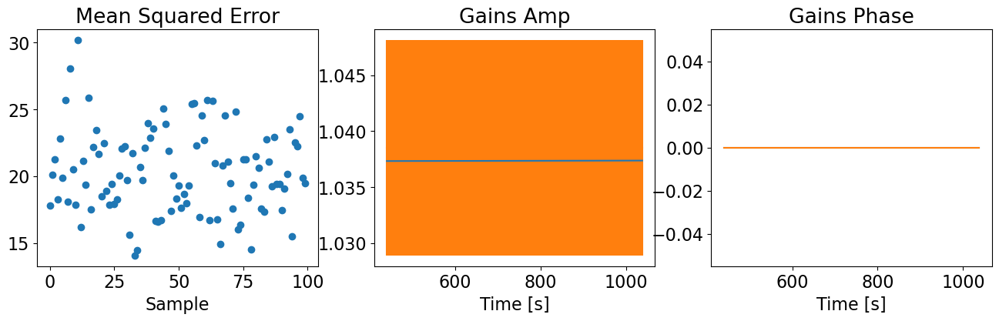

In [379]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = prior_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(prior_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(prior_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(prior_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

In [380]:
flatten(true_params)[0].shape

(1493,)

# MCMC Results

In [381]:
np.set_printoptions(formatter={'float': lambda x: "{0:0.2f}".format(x)})

In [382]:
num_warmup = 500
num_samples = 1000

nuts_kernel = NUTS(model, dense_mass=False)#[('rfi_k_r', 'rfi_k_i')])#[('g_phase_0', 'g_phase_1')])
mcmc = MCMC(nuts_kernel, num_warmup=num_warmup, num_samples=num_samples)
rng_key = random.PRNGKey(0)
mcmc.run(rng_key, params, extra_fields=('potential_energy',), init_params=true_params)

sample: 100%|█| 1500/1500 [09:19<00:00,  2.68it/s, 1023 steps of size 4.10e-03. 


In [383]:
# mcmc.print_summary()

In [401]:
min_idx = jnp.argmin(mcmc.get_extra_fields()['potential_energy'])

In [384]:
pred = Predictive(model, mcmc.get_samples())
mcmc_pred = pred(random.PRNGKey(2), params)

Text(0.5, 0, 'Sample Number')

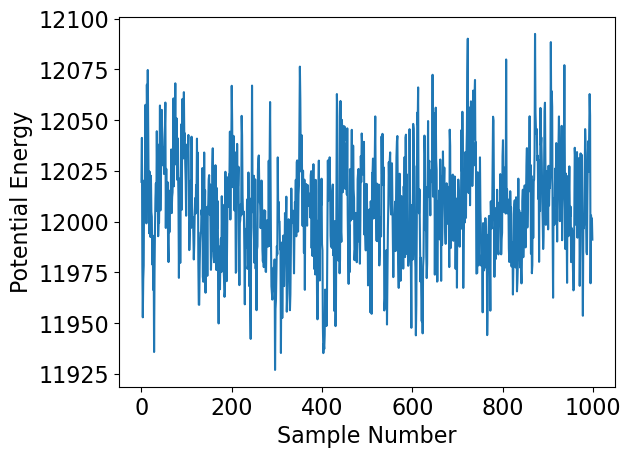

In [385]:
plt.plot(mcmc.get_extra_fields()['potential_energy'][:])
plt.ylabel('Potential Energy')
plt.xlabel('Sample Number')

In [ ]:
mcmc

In [403]:
mcmc_pred['ast_vis'].shape

(1000, 3, 300)

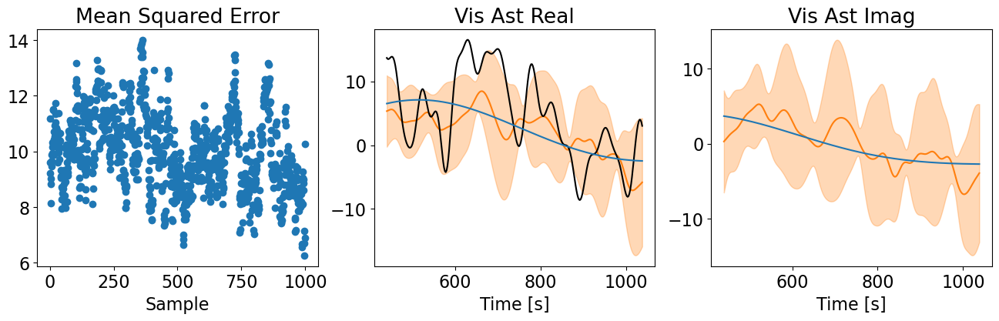

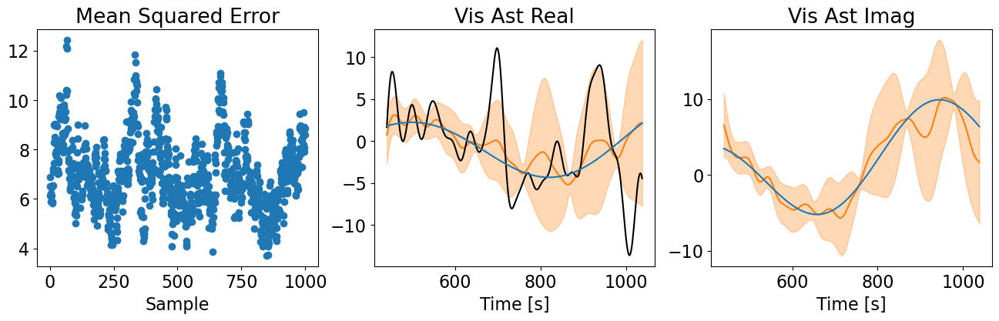

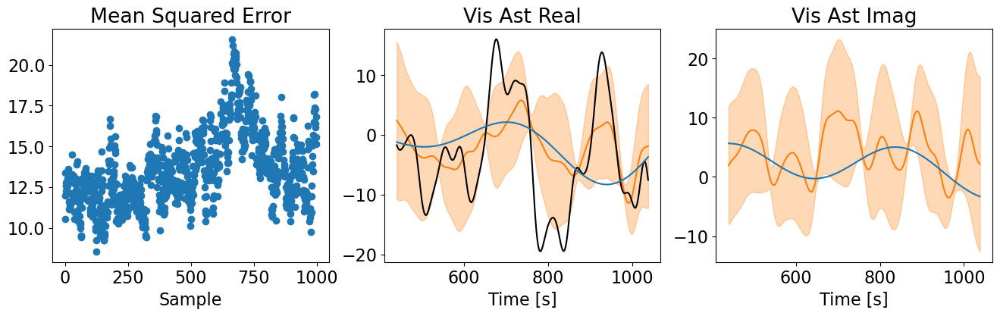

In [405]:
v_ast_pred_m = mcmc_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = mcmc_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = mcmc_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(mcmc_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    # ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].plot(times_, v_ast_pred_m[bl].real, color='tab:orange')
    ax[1].fill_between(times_, v_ast_pred_m[bl].real-v_ast_pred_sr[bl], 
                       v_ast_pred_m[bl].real+v_ast_pred_sr[bl], color='tab:orange', alpha=0.3)
    ax[1].plot(times_, mcmc_pred['ast_vis'][min_idx,bl], 'k')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    # ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].plot(times_, v_ast_pred_m[bl].imag, color='tab:orange')
    ax[2].fill_between(times_, v_ast_pred_m[bl].imag-v_ast_pred_si[bl], 
                       v_ast_pred_m[bl].imag+v_ast_pred_si[bl], color='tab:orange', alpha=0.3)
    ax[2].set_xlabel('Time [s]')

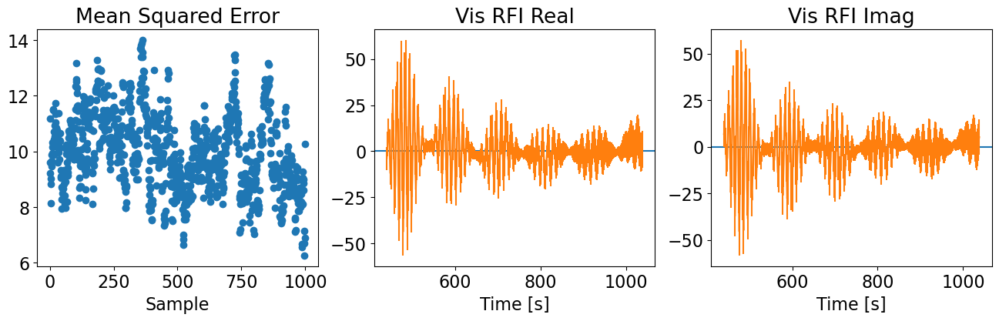

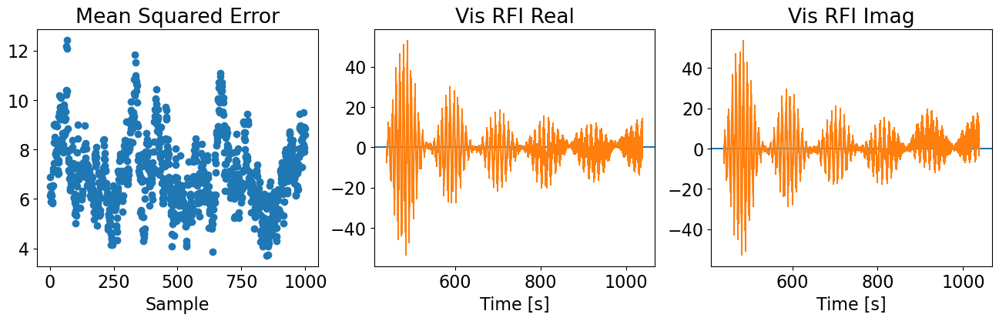

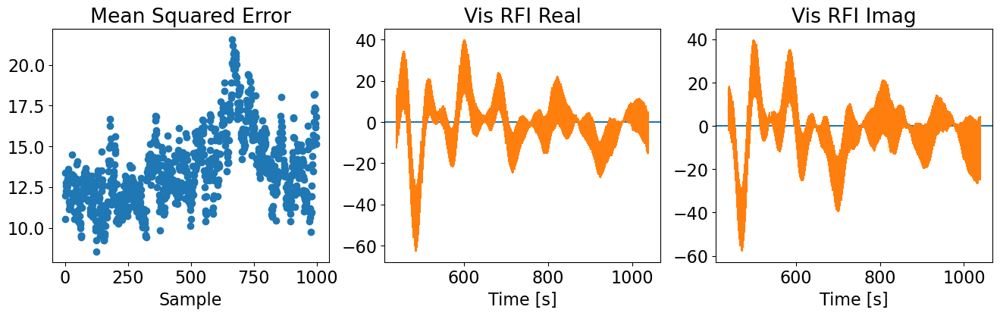

In [391]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = mcmc_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = mcmc_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = mcmc_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(mcmc_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

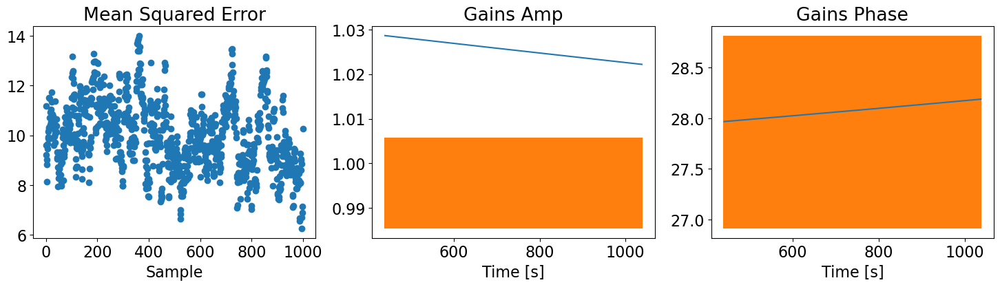

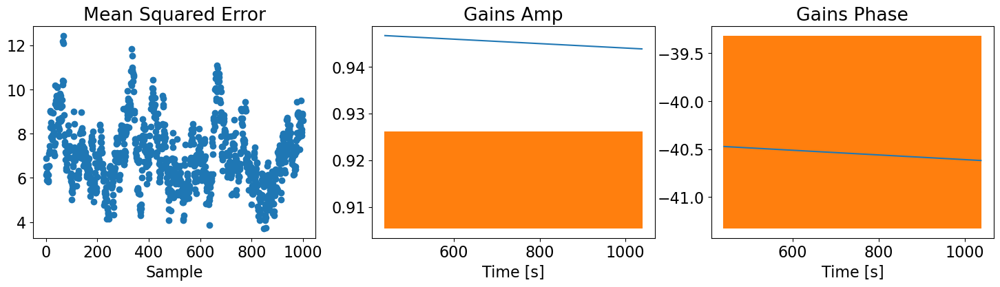

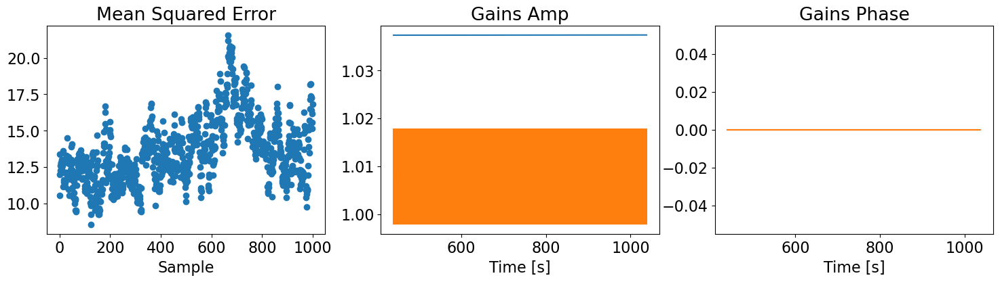

In [392]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = mcmc_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(mcmc_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(mcmc_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(18, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(mcmc_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

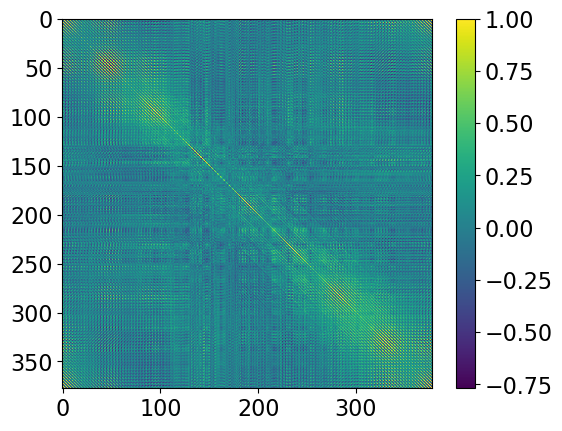

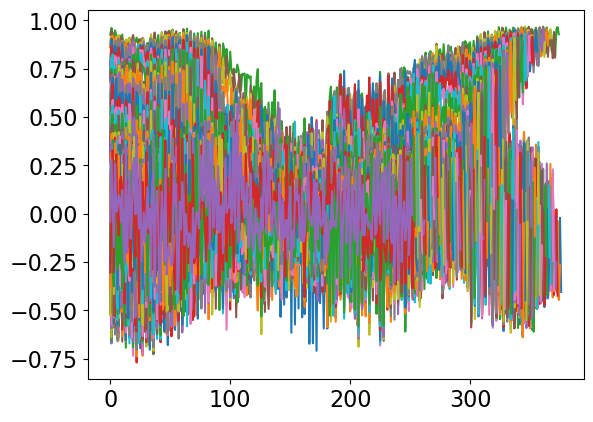

In [393]:
cov = jnp.cov(mcmc.get_samples()['rfi_k_r'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, nn):
    plt.plot(jnp.diag(corr, i))

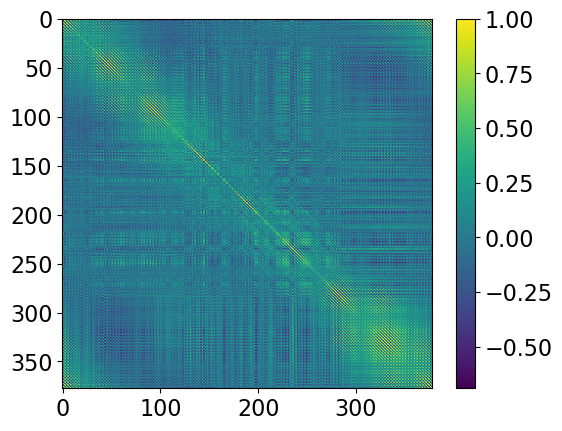

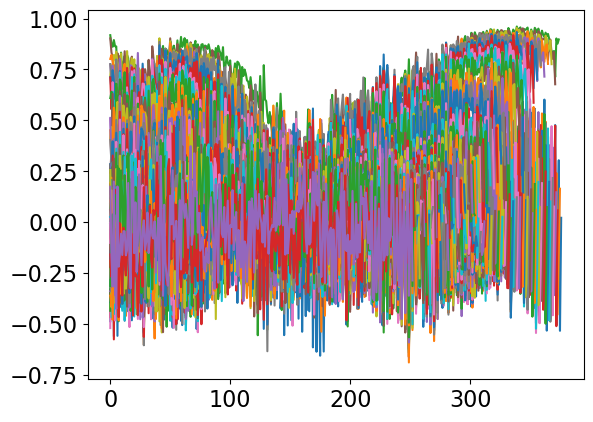

In [394]:
cov = jnp.cov(mcmc.get_samples()['rfi_k_i'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, nn):
    plt.plot(jnp.diag(corr, i))

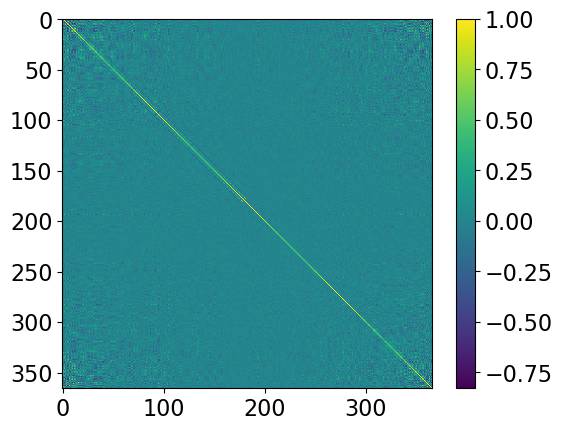

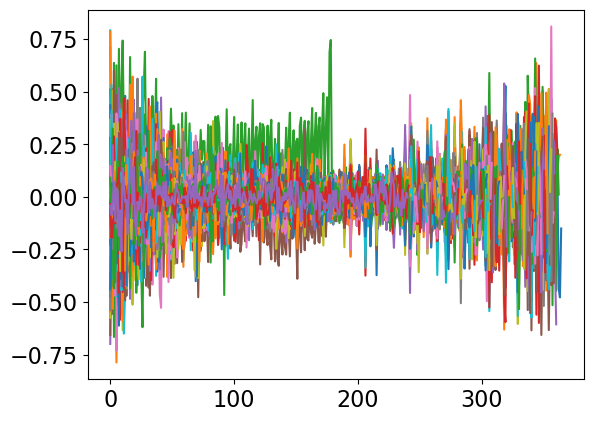

In [395]:
cov = jnp.cov(mcmc.get_samples()['ast_k_r'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, nn):
    plt.plot(jnp.diag(corr, i))

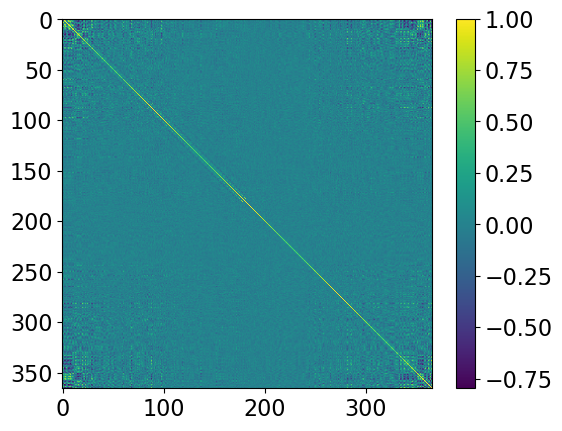

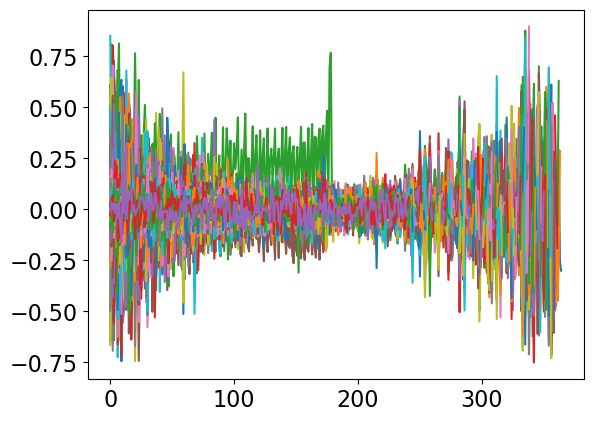

In [396]:
cov = jnp.cov(mcmc.get_samples()['ast_k_i'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, nn):
    plt.plot(jnp.diag(corr, i))

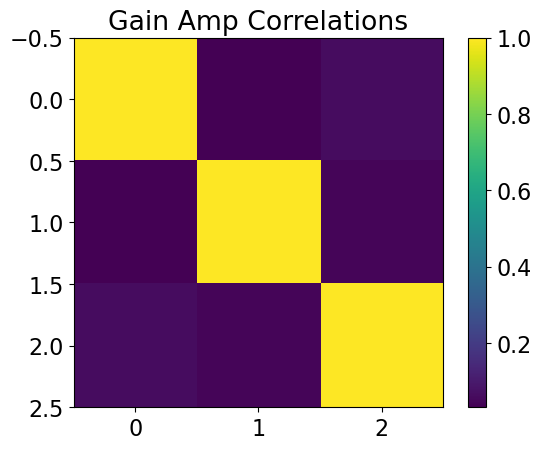

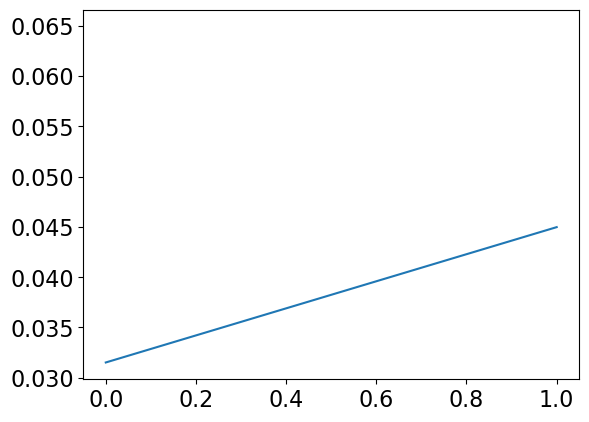

In [397]:
cov = jnp.cov(mcmc.get_samples()[f'g_amp_'].reshape(-1, N_ant).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Gain Amp Correlations')
plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, N_g_time):
    plt.plot(jnp.diag(corr, i))

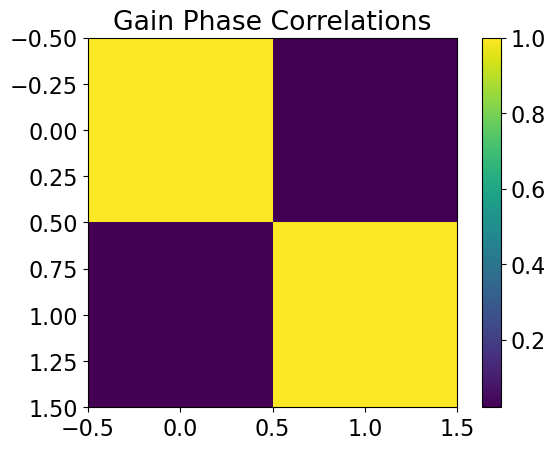

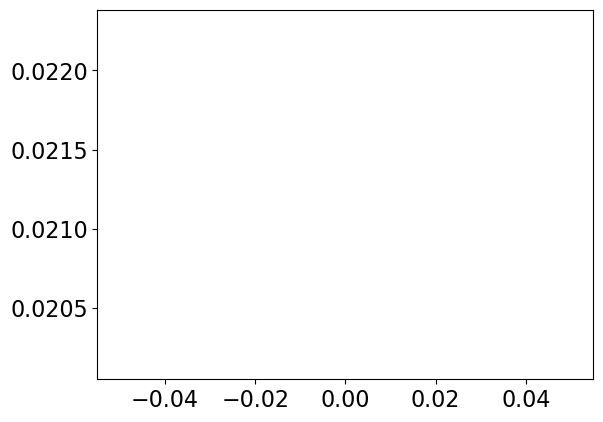

In [398]:
cov = jnp.cov(mcmc.get_samples()[f'g_phase_'].reshape(-1, (N_ant-1)).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Gain Phase Correlations')
plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, N_g_time):
    plt.plot(jnp.diag(corr, i))

In [374]:
def run_svi(model, params, max_iter=1_000, guide_family="AutoDelta", init_params=None):
    if guide_family == "AutoDelta":
        guide = autoguide.AutoDelta(model)
    elif guide_family == "AutoDiagonalNormal":
        guide = autoguide.AutoDiagonalNormal(model)

    optimizer = numpyro.optim.Adam(1e0)
    svi = SVI(model, guide, optimizer, Trace_ELBO())
    svi_results = svi.run(random.PRNGKey(1), max_iter, params=params, init_params=init_params)
    params = svi_results.params

    return params, guide

def svi_predict(model, guide, vi_params, params, num_samples=100):
    predictive = Predictive(
        model=model, guide=guide, params=vi_params, num_samples=num_samples
    )
    predictions = predictive(random.PRNGKey(2), params=params)
    
    return predictions

In [379]:
num_samples = 100

vi_params, vi_guide = run_svi(model, params, max_iter=100_000, guide_family="AutoDiagonalNormal", init_params=true_params)
vi_pred = svi_predict(model, vi_guide, vi_params, params=params, num_samples=num_samples)

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100000/100000 [00:43<00:00, 2315.28it/s, init loss: 52162351.2243, avg. loss [95001-100000]: 371430.8465]


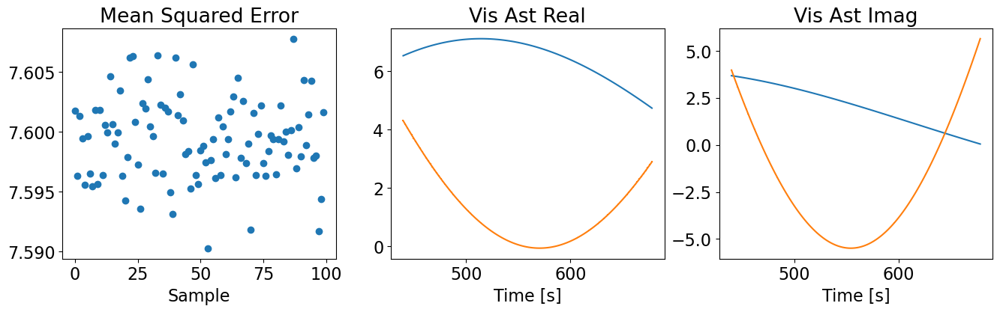

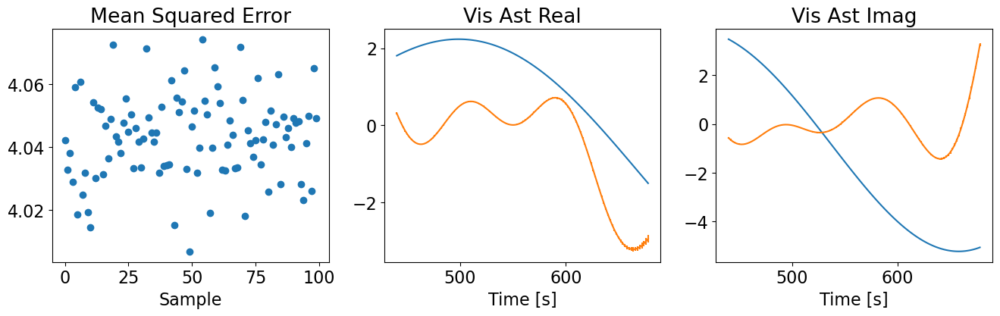

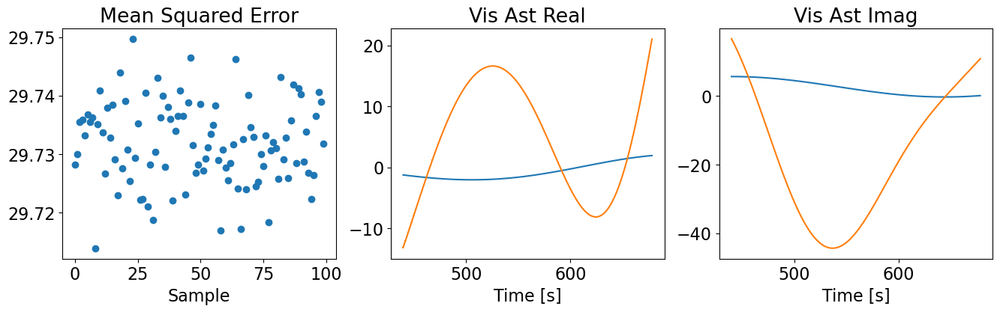

In [376]:
v_ast_pred_m = vi_pred['ast_vis'].mean(axis=0)
v_ast_pred_sr = vi_pred['ast_vis'].real.std(axis=0)
v_ast_pred_si = vi_pred['ast_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(vi_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis Ast Real')
    ax[1].errorbar(times_, v_ast[:,bl,0].real, label='True')
    ax[1].errorbar(times_, v_ast_pred_m[bl].real, v_ast_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis Ast Imag')
    ax[2].errorbar(times_, v_ast[:,bl,0].imag, label='True')
    ax[2].errorbar(times_, v_ast_pred_m[bl].imag, v_ast_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

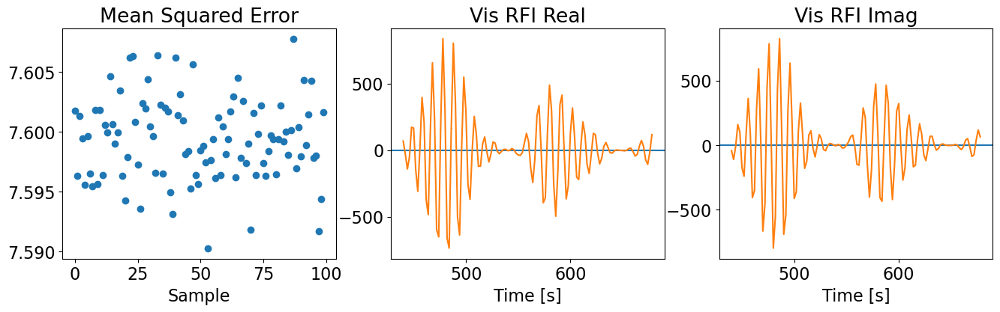

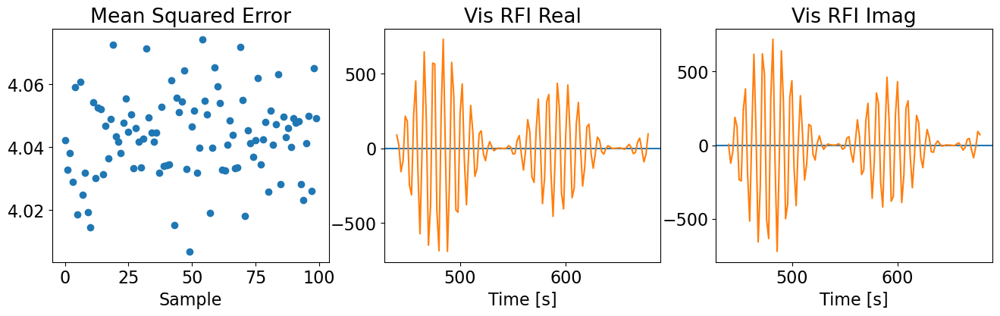

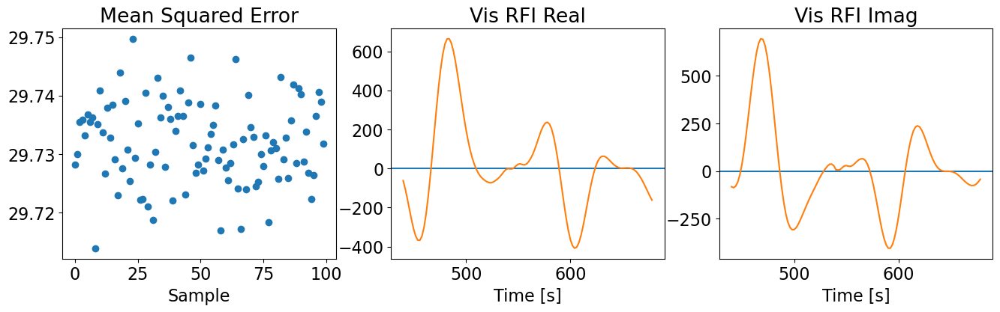

In [377]:
v_rfi_true = v_rfi.reshape(N_time, N_int_samples, N_bl).mean(axis=1)

v_rfi_pred_m = vi_pred['rfi_vis'].mean(axis=0)
v_rfi_pred_sr = vi_pred['rfi_vis'].real.std(axis=0)
v_rfi_pred_si = vi_pred['rfi_vis'].imag.std(axis=0)

for bl in range(N_bl):

    fig, ax = plt.subplots(1, 3, figsize=(16, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(vi_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Vis RFI Real')
    ax[1].axhline(0)
    ax[1].errorbar(times_, v_rfi_pred_m[bl].real-v_rfi_true[:,bl].real, 
                   v_rfi_pred_sr[bl], color='tab:orange', label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Vis RFI Imag')
    ax[2].axhline(0)
    ax[2].errorbar(times_, v_rfi_pred_m[bl].imag-v_rfi_true[:,bl].imag, 
                   v_rfi_pred_si[bl], color='tab:orange', label='Estimate')
    ax[2].set_xlabel('Time [s]')

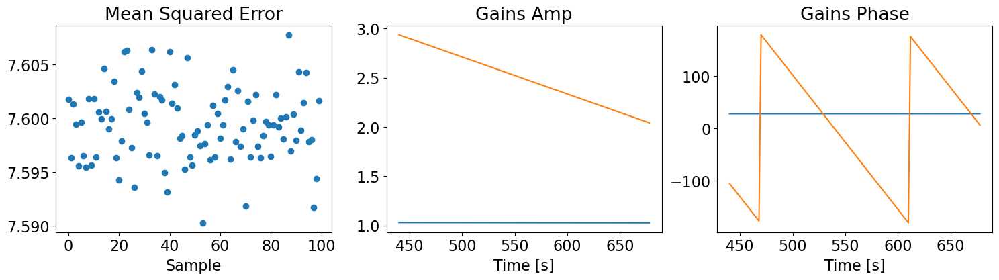

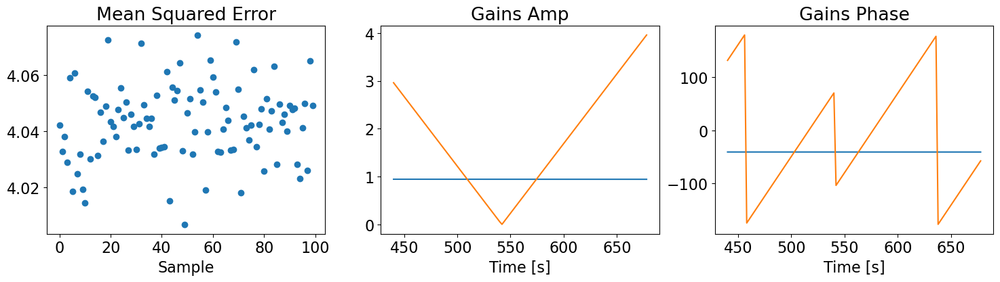

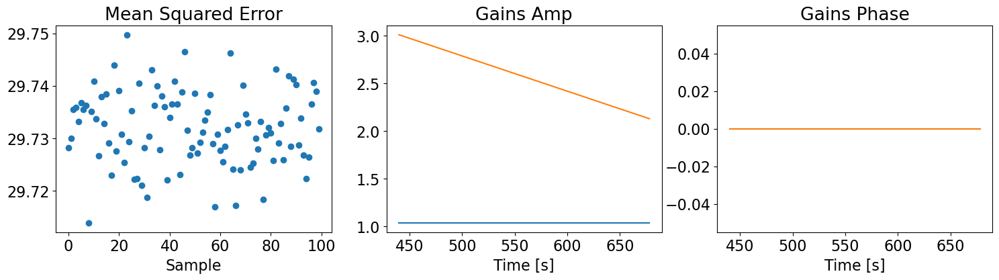

In [378]:
gains_true = gains_ants.reshape(N_time, N_int_samples, N_ant).mean(axis=1)

gains_pred_m = vi_pred['gains'].mean(axis=0)
gains_pred_sr = jnp.abs(vi_pred['gains']).std(axis=0)
gains_pred_si = jnp.rad2deg(jnp.angle(vi_pred['gains'])).std(axis=0)

for bl in range(N_ant):

    fig, ax = plt.subplots(1, 3, figsize=(18, 4))

    ax[0].set_title('Mean Squared Error')
    ax[0].plot(vi_pred['rmse_ast'][:,bl], 'o')
    ax[0].set_xlabel('Sample')

    ax[1].set_title('Gains Amp')
    ax[1].errorbar(times_, jnp.abs(gains_true[:,bl]), label='True')
    ax[1].errorbar(times_, jnp.abs(gains_pred_m[bl]), gains_pred_sr[bl], label='Estimate')
    ax[1].set_xlabel('Time [s]')

    ax[2].set_title('Gains Phase')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_true[:,bl])), label='True')
    ax[2].errorbar(times_, jnp.rad2deg(jnp.angle(gains_pred_m[bl])), gains_pred_si[bl], label='Estimate')
    ax[2].set_xlabel('Time [s]')

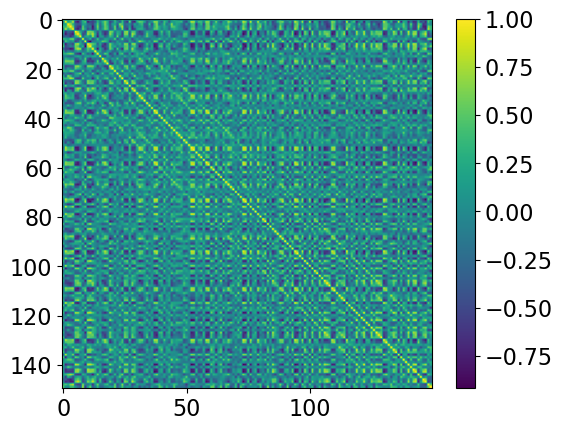

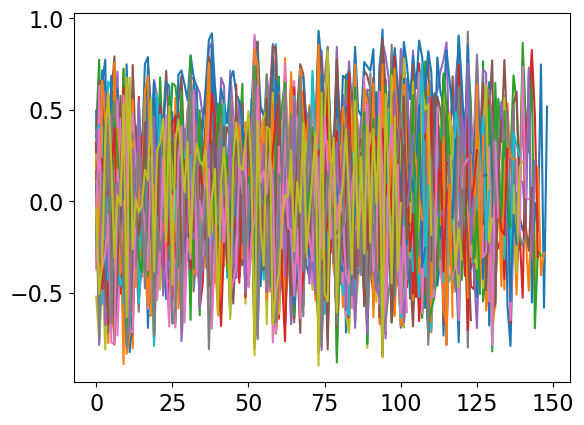

In [358]:
cov = jnp.cov(mcmc.get_samples()['rfi_k_r'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, nn):
    plt.plot(jnp.diag(corr, i))

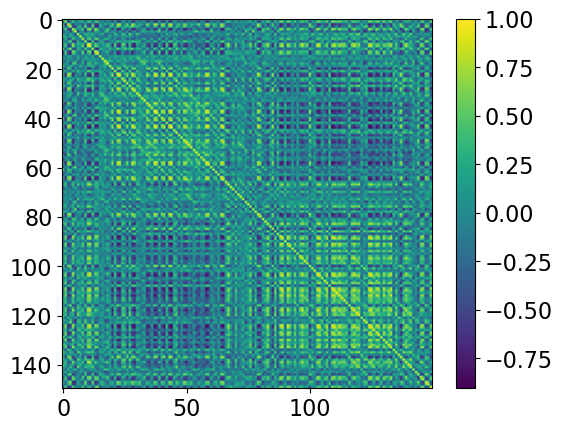

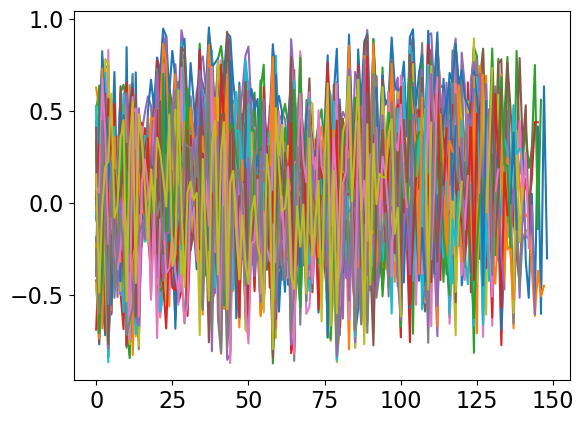

In [360]:
cov = jnp.cov(mcmc.get_samples()['rfi_k_i'].reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, nn):
    plt.plot(jnp.diag(corr, i))

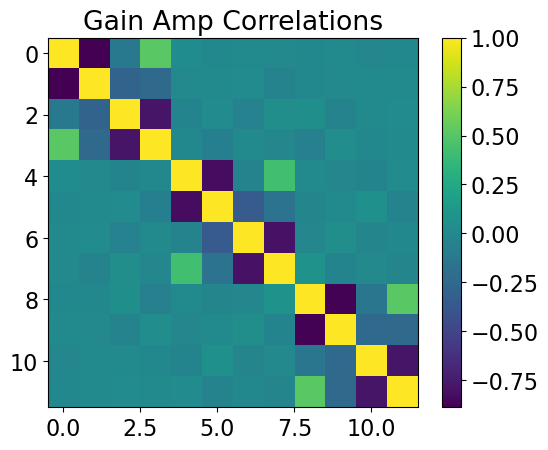

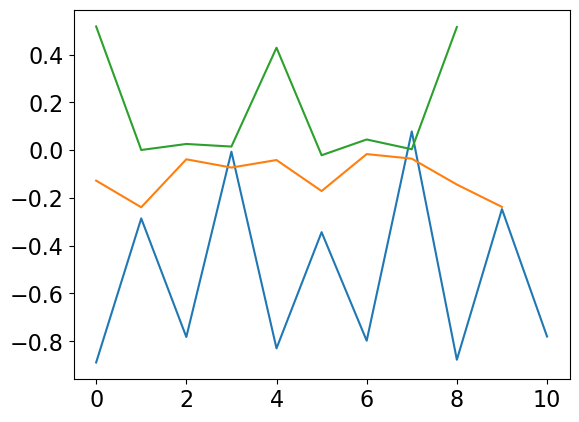

In [362]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'g_amp_{i}']for i in range(N_ant)], axis=-1).reshape(-1, N_ant*N_g_time).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Gain Amp Correlations')
plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, N_g_time):
    plt.plot(jnp.diag(corr, i))

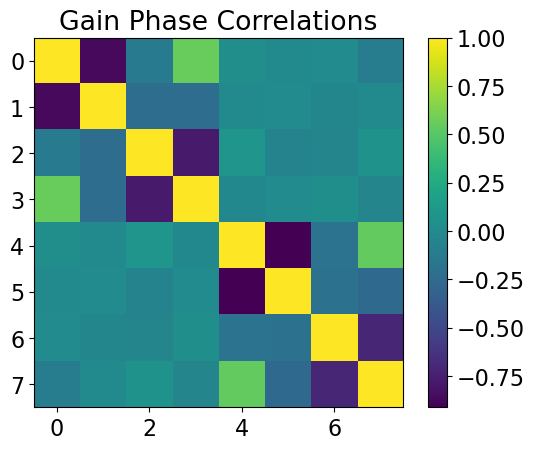

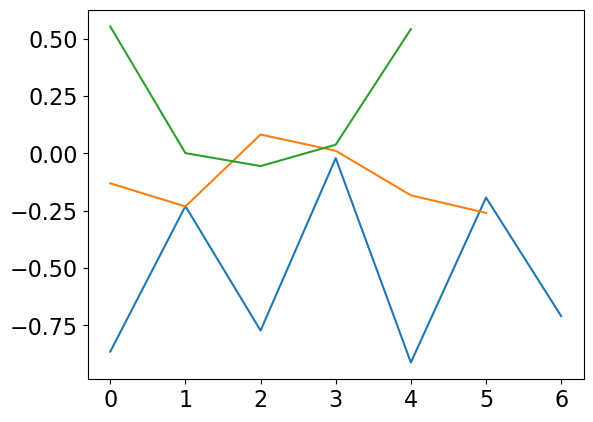

In [363]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'g_phase_{i}']for i in range(N_ant-1)], axis=-1).reshape(-1, N_g_time*(N_ant-1)).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Gain Phase Correlations')
plt.imshow(corr)
plt.colorbar()

plt.figure()
for i in range(1, N_g_time):
    plt.plot(jnp.diag(corr, i))

[-0.60 -0.20 -0.04 -0.33 0.09 0.22 0.23 0.02 0.19 -0.04 0.39 -0.36 0.53
 0.44 0.12 -0.19 0.73 0.94 0.87 -0.42]


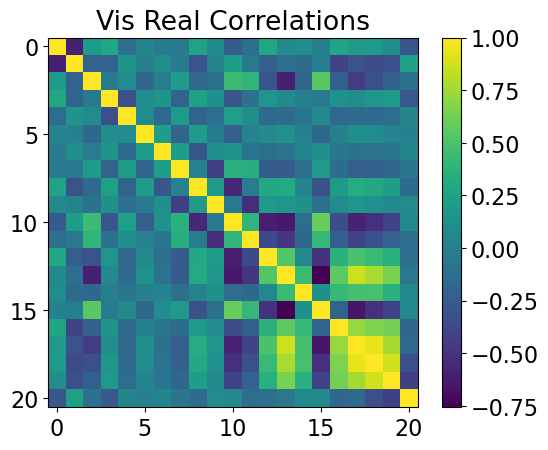

In [364]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'vis_r_{i}']for i in range(N_bl)], axis=-1).reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Vis Real Correlations')
plt.imshow(corr)
plt.colorbar()

print(jnp.diag(corr, 1))

[-0.52 -0.46 -0.10 -0.31 0.13 0.21 0.23 0.23 0.00 0.32 -0.21 0.35 -0.30
 0.31 0.81 0.47 -0.00 0.87 0.48 -0.16]


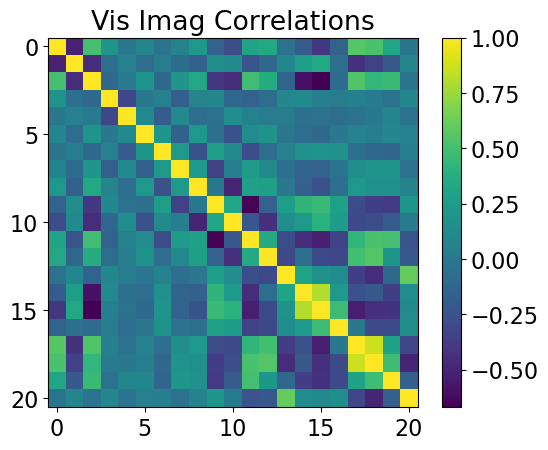

In [365]:
cov = jnp.cov(jnp.concatenate([mcmc.get_samples()[f'vis_i_{i}']for i in range(N_bl)], axis=-1).reshape(num_samples, -1).T)
std = jnp.sqrt(jnp.diag(cov))
corr = cov/std[None,:]/std[:,None]

plt.title('Vis Imag Correlations')
plt.imshow(corr)
plt.colorbar()

print(jnp.diag(corr, 1))

In [ ]:
print()
print(f'Max and Min Vis samples : ({int(n_vis_times.max())}, {int(n_vis_times.min())})')

In [ ]:
inv_cov_vis = jnp.array([jnp.pad(x, ((0,N_vis_time-x.shape[0]),(0,N_vis_time-x.shape[1]))) 
                                          for x in prior_params['inv_cov_vis'].values()])

In [ ]:
sigma = flatten(tree_map(lambda x: jnp.sqrt(jnp.diag(jnp.linalg.inv(x))), params['inv_cov_vis']))[0]

In [ ]:
@jit
def log_multinorm_sum_dict(x, mu, inv_cov):
    return flatten(tree_multimap(log_multinorm, x, mu, inv_cov))[0].sum()

@jit
def log_multinorm_sum2(x, mu, inv_cov):
    return vmap(log_multinorm, in_axes=(0,0,None))(x, mu, inv_cov).sum()

@jit
def log_multinorm_sum3(x, mu, inv_cov):
    return vmap(log_multinorm, in_axes=(0,None,0))(x, mu, inv_cov).sum()

In [ ]:
@jit
def nlp(q, params):
    
    rfi_amp = flatten(q['rfi_amp'])[0]
    # rfi_real = flatten(q['rfi_real'])[0]
    # rfi_imag = flatten(q['rfi_imag'])[0]
    
    G_amp = flatten(q['g_amp'])[0].reshape(N_ant, N_g_time)
    G_phase = flatten(q['g_phase'])[0].reshape(N_ant-1, N_g_time)
    
    lp = log_multinorm_sum2(G_amp, params['mu_G_amp'], params['inv_cov_G_amp']) + \
         log_multinorm_sum2(G_phase, params['mu_G_phase'], params['inv_cov_G_phase']) + \
         jnp.sum(log_normal(rfi_amp, 0.0, params['rfi_amp_std']))
         # log_multinorm(q['rfi_orbit'], params['mu_RFI_orbit'], params['inv_cov_RFI_orbit']) + \
         # jnp.sum(log_normal(rfi_real, 0.0, params['rfi_amp_std'])) + \
         # jnp.sum(log_normal(rfi_imag, 0.0, params['rfi_amp_std']))
         
    
#     V_real = flatten(tree_map(pad_vis, q['v_real']))[0].reshape(N_bl, N_vis_time)
#     V_imag = flatten(tree_map(pad_vis, q['v_imag']))[0].reshape(N_bl, N_vis_time)
#     lp += log_multinorm_sum3(V_real, 0.0, inv_cov_vis) + \
#           log_multinorm_sum3(V_imag, 0.0, inv_cov_vis)
         
    lp += jnp.sum(log_normal(flatten(q['v_real'])[0], 0.0, sigma)) + \
          jnp.sum(log_normal(flatten(q['v_imag'])[0], 0.0, sigma))
    
#     lp += log_multinorm_sum_dict(q['v_real'], params['mu_vis'], params['inv_cov_vis']) + \
#           log_multinorm_sum_dict(q['v_imag'], params['mu_vis'], params['inv_cov_vis'])

    return -1.0*lp

@jit
def nll(q, params, ant1, ant2, bl):

    V_model = model(q, params, ant1, ant2, bl)

    V_obs = jnp.concatenate([params['vis_obs'][:,bl].real,
                             params['vis_obs'][:,bl].imag])

    return -1. * log_normal(V_obs, V_model, params['noise']/jnp.sqrt(2))

@jit
def U(q, params, a1, a2, bl):

    nl_like = vmap(nll, in_axes=(None,None,0,0,0))(q, params, a1, a2, bl).sum()
        
    nl_post = nlp(q, params) + nl_like

    return nl_post

delU = jit(jacrev(U, 0))

In [ ]:
%timeit -r 3 nlp.lower(true_values, params).compile()

In [ ]:
@jit
def nl_like(q, params, a1, a2, bl):
    return vmap(nll, in_axes=(None,None,0,0,0))(q, params, a1, a2, bl).sum()

In [ ]:
a1, a2 = jnp.triu_indices(N_ant, 1)
bl = jnp.arange(len(a1))
%timeit -r 3 nl_like.lower(true_values, params, a1, a2, bl).compile()

In [ ]:
ant1, ant2, baseline = a1[0], a2[0], bl[0]
vis = model(true_values, params, ant1, ant2, baseline)

In [ ]:
n_log = vmap(nll, in_axes=(None,None,0,0,0))(true_values, params, a1, a2, bl)
n_log = n_log.T[N_time:] + n_log.T[:N_time]
n_log.mean()

In [ ]:
vis_m = vmap(model, in_axes=(None,None,0,0,0))(true_values, params, a1, a2, bl).T

In [ ]:
plt.plot(v_obs[:,0,0].real - vis_m[:N_time,0])
# plt.plot()

In [ ]:
%timeit -r 3 U.lower(true_values, params, a1, a2, bl).compile()

In [ ]:
a1, a2 = jnp.triu_indices(N_ant, 1)
bl = jnp.arange(len(a1))
print()
print(f'Energy per data point @ true: {U(true_values, params, a1, a2, bl)/vis_obs.size}')
print()
print(f'U compiled {U._cache_size()} time(s).')

In [ ]:
# %timeit -r 7 U(true_values, params, a1, a2, bl).block_until_ready()

In [ ]:
#jax.make_jaxpr(U)(true_values, params, a1, a2, bl)

In [ ]:
# %timeit -r 1 jit(jacrev(model)).lower(true_values, params, a1[0], a2[0], bl[0]).compile()

In [ ]:
###############################################################

F_prior = {'g_amp': {i: params['inv_cov_G_amp'] for i in range(N_ant)},
           'g_phase': {i: params['inv_cov_G_phase'] for i in range(N_ant-1)},
           'rfi_amp': {i: jnp.eye(N_rfi_time)/params['rfi_amp_std']**2 for i in range(N_ant)},
           # 'rfi_real': {i: jnp.eye(N_rfi_time)/params['rfi_amp_std']**2 for i in range(N_ant)},
           # 'rfi_imag': {i: jnp.eye(N_rfi_time)/params['rfi_amp_std']**2 for i in range(N_ant)},
           # 'rfi_orbit': params['inv_cov_RFI_orbit'],
           'v_real': params['inv_cov_vis'],
           'v_imag': params['inv_cov_vis'],
          }

# zeros_like = lambda x: jnp.zeros((x.size,x.size))
# F_prior = tree_map(zeros_like, true_values)

####################################

def fisher_diag_baseline(q, params, a1, a2, bl):
    
    Jac_model = jacrev(model)(q, params, a1, a2, bl)
    F_block = tree_map(lambda J: (J**2).sum(axis=0)/params['noise']**2, Jac_model)

    return F_block

def fisher_diag(q, params, ant1, ant2, baseline, F_prior):
    
    @progress_bar_scan(N_bl)
    def add_baseline_fisher(F, i):
        F_i = fisher_diag_baseline(q, params, ant1[i], ant2[i], baseline[i])
        return tree_map(lambda x, y: x+y, F, F_i), i
    
    return scan(add_baseline_fisher, F_prior, jnp.arange(N_bl))[0]

def fisher_diag(q, params, ant1, ant2, baseline, F_prior):
    
    Jacmodel = jit(jacrev(model))
    
    def fisher_diag_baseline(q, params, a1, a2, bl):
    
        J, _ = flatten((q, params, a1, a2, bl))
        F_diag = ((J/params['noise'])**2).sum(axis=0)

        return F_diag
    
#     @progress_bar_scan(N_bl)
    def add_baseline_fisher(F, i):
        F_i = fisher_diag_baseline(q, params, ant1[i], ant2[i], baseline[i])
        return F + F_i
    
    
    F, unflatten = flatten(F_prior)
    for i in tqdm(range(N_bl)):
        F = add_baseline_fisher(F, i)
    
    return unflatten(F)



def fisher_block(q, params, ant1, ant2, baseline, F_prior):
    
    Jac_model = jacrev(model)
    
    def fisher_block_baseline(q, params, a1, a2, bl):
        
        J = Jac_model(q, params, a1, a2, bl)
        F_block = tree_map(lambda J: J.T@J/params['noise']**2, J)

        return F_block

    @progress_bar_scan(N_bl)
    def add_baseline_fisher(F, i):
        F_i = fisher_block_baseline(q, params, ant1[i], ant2[i], baseline[i])
        return tree_map(lambda x, y: x+y, F, F_i), i
    
    return scan(add_baseline_fisher, F_prior, jnp.arange(N_bl))[0]

################
def block_std(F_block):

    std = tree_map(lambda F: jnp.sqrt(jnp.diag(jnp.linalg.inv(F))), F_block)

    return std

#############################################################

q_dev = {'v_real': {i: x for i, x in enumerate(0.65*random.normal(random.PRNGKey(10), (N_bl,)))},
         'v_imag': {i: x for i, x in enumerate(0.65*random.normal(random.PRNGKey(11), (N_bl,)))},
         'g_amp':  {i: x for i, x in enumerate(1.0*random.normal(random.PRNGKey(12), (N_ant,)))},
         'g_phase': {i: x for i, x in enumerate(1.0*random.normal(random.PRNGKey(13), (N_ant-1,)))},
         # 'rfi_amp': {i: x for i, x in enumerate(0.1*random.normal(random.PRNGKey(14), (N_ant,)))},
         'rfi_real': {i: x for i, x in enumerate(0.1*random.normal(random.PRNGKey(14), (N_ant,)))},
         'rfi_imag': {i: x for i, x in enumerate(0.1*random.normal(random.PRNGKey(14), (N_ant,)))},
         'rfi_orbit': random.multivariate_normal(random.PRNGKey(15),
                                                 jnp.zeros(len(cov_RFI_orbit)),
                                                 1e0*cov_RFI_orbit)
        }

q_dev = {'v_real': {i: 1*0.65*random.normal(random.PRNGKey(10+i), (n_vis_times[i],)) for i in range(N_bl)},
         'v_imag': {i: 1*0.65*random.normal(random.PRNGKey(100+i), (n_vis_times[i],)) for i in range(N_bl)},
         'g_amp':  {i: x for i, x in enumerate(1.0*random.normal(random.PRNGKey(12), (N_ant,)))},
         'g_phase': {i: x for i, x in enumerate(1.0*random.normal(random.PRNGKey(13), (N_ant-1,)))},
         'rfi_amp': {i: x for i, x in enumerate(0.1*random.normal(random.PRNGKey(14), (N_ant,)))},
         # 'rfi_real': {i: x for i, x in enumerate(5*0.1*random.normal(random.PRNGKey(14), (N_ant,)))},
         # 'rfi_imag': {i: x for i, x in enumerate(5*0.1*random.normal(random.PRNGKey(14), (N_ant,)))},
         # 'rfi_orbit': random.multivariate_normal(random.PRNGKey(15),
         #                                         jnp.zeros(len(cov_RFI_orbit)),
         #                                         1e0*cov_RFI_orbit)
        }

qi = tree_map(lambda x, y: x + y, true_values, q_dev)

# qi = {
#     'v_real': 

#########################################

print()
print(f'Number of data points: {2*params["vis_obs"].size}')
print()
print(f'Number of parameters: {len(flatten(qi)[0])}')
print()
print(f'Energy per data point @ qi: {U(qi, params, a1, a2, bl)/params["vis_obs"].size}')
print()
# print(f'U compiled {U._cache_size()} time(s).')
# print()

In [ ]:
plt.imshow(F['rfi_amp'][0])
plt.colorbar()

In [ ]:
for i in range(N_ant):
    plt.figure()
    plt.title(f'RFI Amp Correlations ant: {i}')
    std = jnp.sqrt(jnp.diag(F_inv['rfi_amp'][i]))
    plt.imshow(F_inv['rfi_amp'][i]/std[:,None]/std[None,:])
    plt.colorbar()

In [ ]:
plt.imshow(F_prior['rfi_amp'][0])
plt.colorbar()

In [ ]:
# %timeit -r 7 U(qi, params, a1, a2, bl).block_until_ready()

In [ ]:
F = fisher_block(true_values, params, a1, a2, bl, F_prior)
F_inv = tree_map(jnp.linalg.inv, F)

In [ ]:
# F = fisher_block(qi, params, a1, a2, bl, F_prior)
# F_inv = tree_map(jnp.linalg.inv, F)

In [ ]:
# F = fisher_block(qi, params, a1, a2, bl, F_prior)
# F_inv = tree_map(lambda x: 1./np.diag(x), F)

In [ ]:
F_prior_diag = tree_map(jnp.diag, F_prior)
F = fisher_diag(qi, params, a1, a2, bl, F_prior_diag)
F_inv = tree_map(lambda x: 1./x, F)

In [ ]:
####################################################

@jit
def nat_grad_step(q, a1s, a2s, bls, alpha):
    
    update = lambda F_inv, D: alpha*F_inv@D
    # update = lambda F_inv, D: alpha*F_inv*D
    D = delU(q, params, a1s, a2s, bls)
    return tree_map(update, F_inv, D)
    

def nat_grad(qi, alpha, Niter=1000, tol=1e-6):
    a1, a2 = jnp.triu_indices(N_ant, 1)
    bl = jnp.arange(len(a1))
    U_i = U(qi, params, a1, a2, bl)/vis_obs.size
    pbar = tqdm(range(0, Niter))
    for i in pbar:
        # step = alpha*0.99**(i/100)
        step = alpha
        qf = tree_map(lambda x, y: x-y, qi, nat_grad_step(qi, a1, a2, bl, step))
        U_f = U(qf, params, a1, a2, bl)/vis_obs.size
        if i%100==1:
            pbar.set_description(f'NL Posterior = {round(float(U_f), 3)}, alpha = {step:.1E}')
        if np.isnan(U_f) or U_f > U_i :
            # print('Alpha halved')
            alpha /= 2
        elif jnp.abs(U_i-U_f) < tol:
            print('Tolerence reached')
            if U_f > U_i and U_f > 2.:
                print('Failed to converge!')
                return None
            return qi
        else:
            U_i = U_f
            qi = qf
    return qi

# MAP = nat_grad(qi, 1e-1, 10000, 1e-6)
# MAP = nat_grad(MAP, 2e-2, 10000, 1e-5)
MAP = nat_grad(true_values, 5e-2, 100000, 1e-9)
# MAP = true_values

# print()
# print(f'U compiled {U._cache_size()} time(s).')
# print()
# print(f'nat_grad_step compiled {nat_grad_step._cache_size()} time(s).')

In [ ]:
def saveParams(file_path, q, F_inv):
    with h5py.File(file_path, 'w') as fp:
        fp['times_fine'] = times
        
        for i in range(len(q['v_real'])):
            fp[f'vis/{i}'] = q['v_real'][i] + 1.j*q['v_imag'][i]
            fp[f'vis_cov/{i}'] = F_inv['v_real'][i]
            fp[f'vis_times/{i}'] = vis_times[i]
        fp['vis_var'] = vis_var
        fp['vis_l'] = vis_l
        
        V_real = flatten(tree_map(pad_vis, q['v_real']))[0].reshape(N_bl, N_vis_time)
        V_imag = flatten(tree_map(pad_vis, q['v_imag']))[0].reshape(N_bl, N_vis_time)
        fp['vis_fine'] = vmap(jnp.dot)(params['resample_vis'], (V_real + 1.j*V_imag))
        
        G_amp = flatten(q['g_amp'])[0].reshape(N_ant, N_g_time)
        G_phase = flatten(q['g_phase'])[0].reshape(N_ant-1, N_g_time)
        G_phase = jnp.concatenate([G_phase, jnp.zeros((1, N_g_time))], axis=0)
        G = G_amp*jnp.exp(1.j*G_phase)
        fp['gains'] = G

        G_amp = (params['resample_g_amp']@G_amp.T)
        G_phase = (params['resample_g_phase']@G_phase.T)
        G = G_amp*jnp.exp(1.j*G_phase)
        fp['gains_fine'] = G
        
        # rfi_amp = flatten(q['rfi_amp'])[0].reshape(N_ant, N_rfi_time).T
        # fp['rfi_amp'] = rfi_amp
        # fp['rfi_amp_fine'] = params['resample_rfi']@rfi_amp
        fp['rfi_orbit'] = q['rfi_orbit']
        
        fp['g_amp_cov'] = flatten(F_inv['g_amp'])[0].reshape(N_ant,N_g_time,N_g_time)
        
        fp['g_phase_cov'] = flatten(F_inv['g_phase'])[0].reshape(N_ant-1,N_g_time,N_g_time)
        
        # fp['rfi_amp_cov'] = flatten(F_inv['rfi_amp'])[0].reshape(N_ant,N_rfi_time,N_rfi_time)
        fp['rfi_orbit_cov'] = F_inv['rfi_orbit']

In [ ]:
save_path = f'data/Params_{N_ant}A_Complex.h5'

saveParams(save_path, MAP, F_inv)

In [ ]:
print()
print('Estimating Posterior Errors')
print('---------------------------')

std = block_std(F)

with h5py.File(save_path, 'r') as fp:
    v_pred = fp['vis_fine'][()].T
    noise_cov = {i: fp['vis_cov'][f'{i}'][()] for i in range(N_bl)}
    vis_times = {i: fp['vis_times'][f'{i}'][()] for i in range(N_bl)}
    vis_var_d = {i: fp['vis_var'][i] for i in range(N_bl)}
    vis_l_d = {i: fp['vis_l'][i] for i in range(N_bl)}
v_pred = jnp.concatenate([v_pred.real.flatten(), v_pred.imag.flatten()])
cov_fine = tree_map(resampled_cov, vis_times, {i: times for i in range(N_bl)}, vis_var_d, vis_l_d, noise_cov)
v_std = vmap(lambda x: jnp.sqrt(jnp.diag(x)))(flatten(cov_fine)[0].reshape(N_bl,N_time,N_time))
v_std = jnp.sqrt(jnp.concatenate([v_std.flatten(), v_std.flatten()]))
v_true = vis_ast.reshape(N_time, N_int_samples, -1).mean(axis=1)
v_true = jnp.concatenate([v_true.real.flatten(), v_true.imag.flatten()])
res = v_pred - v_true

bias = res/v_std

print()
print(f'RMSE : {jnp.sqrt(jnp.mean(res**2))}')
print()
print(f'STD : {v_std.mean()}')
print()
print('Normalized')
print('-----------')
print(f'Mean : {bias.mean()}')
print(f'STD : {bias.std()}')

In [ ]:
b = jnp.abs(bias)
100*len(b[b<1])/len(b)

In [ ]:
print()
print(f'End Time : {datetime.now()}')
print()
print(f'Time Taken: {datetime.now()-start}')

In [ ]:
bl = int(jnp.argmin(flatten(vis_l)[0]))
n_std = 2

with h5py.File(save_path, 'r') as fp:
    vis = {i: fp[f'vis'][f'{i}'][()] for i in range(N_bl)}
    v_pred = fp['vis_fine'][()].T
    noise_cov = {i: fp['vis_cov'][f'{i}'][()] for i in range(N_bl)}
cov_fine = tree_map(resampled_cov, vis_times, {i: times for i in range(N_bl)}, vis_var_d, vis_l_d, noise_cov)
v_std = vmap(lambda x: jnp.sqrt(jnp.diag(x)))(flatten(cov_fine)[0].reshape(N_bl,N_time,N_time)).T

est = vis[bl].real
mean = v_pred[:,bl].real
std = v_std[:,bl]
true = vis_ast[:,bl,0].real
noise = noise/jnp.sqrt(2.)

plt.plot(times, params['resample_vis'][bl]@qi['v_real'][bl], 'r')

plt.plot(times_fine, true, color='k', label='True')
plt.fill_between(times_fine, true-n_std*noise, true+n_std*noise, 
                 color='tab:grey', alpha=0.3, 
#                  label=f'{int(n_std)}'+r'$\sigma$'
                )
plt.plot(times, mean, color='tab:blue', label='GP')
plt.fill_between(times, mean-n_std*std, mean+n_std*std, 
                 color='tab:blue', alpha=0.3, 
#                  label=f'{int(n_std)}'+r'$\sigma$'
                )
plt.plot(vis_times[bl], est, 'o', color='tab:blue', label='Estimates')

plt.legend()
plt.title(f'{round(mag_uvw[bl])} m Baseline')
plt.xlabel('Observation Time [s]')
plt.ylabel('Visibility Real [Jy]')

In [ ]:
bl = int(jnp.argmin((mag_uvw-3000)**2))
n_std = 2

with h5py.File(save_path, 'r') as fp:
    vis = {i: fp[f'vis'][f'{i}'][()] for i in range(N_bl)}
    v_pred = fp['vis_fine'][()].T
    noise_cov = {i: fp['vis_cov'][f'{i}'][()] for i in range(N_bl)}
cov_fine = tree_map(resampled_cov, vis_times, {i: times for i in range(N_bl)}, vis_var_d, vis_l_d, noise_cov)
v_std = vmap(lambda x: jnp.sqrt(jnp.diag(x)))(flatten(cov_fine)[0].reshape(N_bl,N_time,N_time)).T

est = vis[bl].real
mean = v_pred[:,bl].real
std = v_std[:,bl]
true = vis_ast[:,bl,0].real
noise = noise/jnp.sqrt(2.)

plt.plot(times_fine, true, color='k', label='True')
plt.fill_between(times_fine, true-n_std*noise, true+n_std*noise, 
                 color='tab:grey', alpha=0.3, 
#                  label=f'{int(n_std)}'+r'$\sigma$'
                )
plt.plot(times, mean, color='tab:blue', label='GP')
plt.fill_between(times, mean-n_std*std, mean+n_std*std, 
                 color='tab:blue', alpha=0.3, 
#                  label=f'{int(n_std)}'+r'$\sigma$'
                )
plt.plot(vis_times[bl], est, 'o', color='tab:blue', label='Estimates')

plt.legend()
plt.title(f'{round(mag_uvw[bl])} m Baseline')
plt.xlabel('Observation Time [s]')
plt.ylabel('Visibility Real [Jy]')

In [ ]:
bl = int(jnp.argmax(flatten(vis_l)[0]))
n_std = 2

with h5py.File(save_path, 'r') as fp:
    vis = {i: fp[f'vis'][f'{i}'][()] for i in range(N_bl)}
    v_pred = fp['vis_fine'][()].T
    noise_cov = {i: fp['vis_cov'][f'{i}'][()] for i in range(N_bl)}
cov_fine = tree_map(resampled_cov, vis_times, {i: times for i in range(N_bl)}, vis_var_d, vis_l_d, noise_cov)
v_std = vmap(lambda x: jnp.sqrt(jnp.diag(x)))(flatten(cov_fine)[0].reshape(N_bl,N_time,N_time)).T

est = vis[bl].real
mean = v_pred[:,bl].real
std = v_std[:,bl]
true = vis_ast[:,bl,0].real
noise = noise/jnp.sqrt(2.)

plt.plot(times_fine, true, color='k', label='True')
plt.fill_between(times_fine, true-n_std*noise, true+n_std*noise, 
                 color='tab:grey', alpha=0.3, 
#                  label=f'{int(n_std)}'+r'$\sigma$'
                )
plt.plot(times, mean, color='tab:blue', label='GP')
plt.fill_between(times, mean-n_std*std, mean+n_std*std, 
                 color='tab:blue', alpha=0.3, 
#                  label=f'{int(n_std)}'+r'$\sigma$'
                )
plt.plot(vis_times[bl], est, 'o', color='tab:blue', label='Estimates')

plt.legend()
plt.title(f'{round(mag_uvw[bl])} m Baseline')
plt.xlabel('Observation Time [s]')
plt.ylabel('Visibility Real [Jy]')

In [ ]:
@jit
def vis_prior(q):
    V_real = flatten(tree_map(pad_vis, q['v_real']))[0].reshape(N_bl, N_vis_time)
#     V_imag = flatten(tree_map(pad_vis, q['v_imag']))[0].reshape(N_bl, N_vis_time)
    return log_multinorm_sum(V_real, jnp.zeros(N_bl), inv_cov_vis)

In [ ]:
@jit
def vis_prior2(q):
    V_real = flatten(q['v_real'])[0]
#     V_imag = flatten(tree_map(pad_vis, q['v_imag']))[0].reshape(N_bl, N_vis_time)
    return log_normal(V_real, jnp.zeros(len(V_real)), sigma).sum()

In [ ]:
%timeit -r 7 vis_prior.lower(true_values).compile()

In [ ]:
%timeit -r 7 vis_prior2.lower(true_values).compile()

In [ ]:
vis_prior(true_values)

In [ ]:
vis_prior2(true_values)

In [ ]:
log_multinorm_sum_dict(true_values['v_real'], params['mu_vis'], params['inv_cov_vis'])

In [ ]:
@jit
def log_multinorm_dict(x, mu, inv_cov):
    return tree_multimap(log_multinorm, x, mu, inv_cov)

In [ ]:
%timeit -r 7 log_multinorm_dict.lower(true_values['v_real'], params['mu_vis'], params['inv_cov_vis']).compile()

In [ ]:
%timeit -r 7 log_multinorm_sum_dict.lower(true_values['v_real'], params['mu_vis'], params['inv_cov_vis']).compile()

In [ ]:
%timeit -r 7 log_multinorm_sum_array.lower(flatten(true_values['g_amp'])[0].reshape(N_ant, N_g_time), params['mu_G_amp'], params['inv_cov_G_amp']).compile()

In [ ]:
# class tabascal:
#     def __init__(self, n_ant: int, times: jnp.ndarray, times_fine: jnp.ndarray, freqs: jnp.ndarray, 
#                  qi: dict, true_values: dict, n_int_samples: int, n_rfi_time: int, n_g_time: int, 
#                  n_vis_time: int, scalings: dict, inv_scalings: dict, n_bl: int, noise: float, 
#                  vis_obs: jnp.ndarray, ants_xyz: jnp.ndarray, phase_corrections: jnp.ndarray, 
#                  resamplings: dict, antenna1: jnp.ndarray, antenna2: jnp.ndarray
#                 ):
        
#         self.n_ant = n_ant
#         self.n_time = len(times)
#         self.n_int_samples = n_int_samples
#         self.n_rfi_time = n_rfi_time
#         self.n_g_time = n_g_time
#         self.n_vis_time = n_vis_time
#         self.qi = qi
#         self.q = qi
#         self.times = times
#         self.freqs = freqs
#         self.scalings = scalings
#         self.inv_scalings = inv_scalings
#         self.n_bl = n_bl
#         self.times = times
#         self.times_fine = times_fine
#         self.noise = noise
#         self.ants_xyz = ants_xyz
#         self.phase_corrections = phase_corrections
#         self.vis_obs = vis_obs
#         self.resamplings = resamplings
#         self.true_values = true_values#self.scale_parameters(true_values, scalings)
#         self.antenna1 = antenna1
#         self.antenna2 = antenna2
#         self.baselines = jnp.arange(n_bl)
    
#     @jit
#     def rfi_closures(self, q, ants):

#         rfi_amp = flatten(q['rfi_amp'])[0].reshape(self.n_ant,
#                                                         self.n_rfi_time)[ants]
#         rfi_amp = (self.resamplings['resample_rfi']@rfi_amp.T).T

#         rfi_xyz = orbit(self.times_fine, *q['rfi_orbit'])
#         distances = jnp.linalg.norm(self.ants_xyz[:,ants]-rfi_xyz[:,None,:], axis=2)
#         c_distances = (distances-self.phase_corrections[:,ants])[...,None]

#         return rfi_amp, c_distances
        
#     @jit
#     def rfi_vis(self, app_amplitude, c_distances, freqs):
#         '''
#         Calculate visibilities from distances to rfi sources.

#         Parameters:
#         -----------
#         app_amplitude: jnp.array (n_time, 2, n_freq, n_src)
#             Apparent amplitude at the antennas.
#         c_distances: jnp.array (n_time, 2, n_src)
#             The phase corrected distances between the rfi sources and the antennas.
#         freqs: jnp.array (n_freq,)
#             Frequencies.

#         Returns:
#         --------
#         vis: jnp.array (n_time, 1, n_freq)
#             The visibilities.
#         '''
#         n_time, n_ant, n_freq, n_src = app_amplitude.shape
#         c = 2.99792458e8

#         # Create array of shape (n_time, n_bl, n_freq, n_src) and then sum over n_src

#         minus_two_pi_over_lamda = (-2.0*jnp.pi*freqs/c).reshape(1,1,n_freq,1)

#         c_distances = c_distances.reshape(n_time,n_ant,1,n_src)

#         phase = minus_two_pi_over_lamda*(c_distances[:,0]-c_distances[:,1])
#         intensities_app = app_amplitude[:,0]*app_amplitude[:,1]

#         vis = jnp.sum(intensities_app*jnp.exp(-1.j*phase), axis=-1)

#         return vis

#     @jit
#     def baseline_gains(self, q, ants):

#         G_amp = flatten(q['g_amp'])[0].reshape(self.n_ant, self.n_g_time)[ants]
#         G_phase = flatten(q['g_phase'])[0].reshape(self.n_ant-1, self.n_g_time)
#         G_phase = jnp.concatenate([G_phase, jnp.zeros((1, N_g_time))], axis=0)[ants]

#         G_amp = (self.resamplings['resample_g_amp']@G_amp.T).T
#         G_phase = (self.resamplings['resample_g_phase']@G_phase.T).T

#         G = G_amp*jnp.exp(1.j*G_phase)

#         return G[0]*jnp.conjugate(G[1])

#     @jit
#     def model(self, ant1, ant2, bl):

#         q = self.scale_parameters(self.q, self.inv_scalings)

#         ants = jnp.array([ant1, ant2])

#         V_real = flatten(q['v_real'])[0].reshape(self.n_bl, self.n_vis_time)[bl]
#         V_imag = flatten(q['v_imag'])[0].reshape(self.n_bl, self.n_vis_time)[bl]
#         V_ast = V_real + 1.j*V_imag

#         V_ast = self.resamplings['resample_vis'][bl]@V_ast

#     #     Calculate the visibility contribution from the RFI
#         rfi_amp, c_distances = self.rfi_closures(q, ants)
#         V_rfi = self.rfi_vis(rfi_amp.T[:,:,None,None], c_distances, self.freqs)[...,0]
#         V_rfi = V_rfi.reshape(self.n_time, self.n_int_samples).mean(axis=1)

#         G_bl = self.baseline_gains(q, ants)

#         model_vis = (G_bl*(V_ast+V_rfi))

#         return jnp.concatenate([model_vis.real.flatten(), model_vis.imag.flatten()])

#     @jit
#     def scale_parameters(self, q, scalings):
#         q['g_amp'] = tree_map(lambda x: scalings['g_amp']*x, q['g_amp'])
#         q['g_phase'] = tree_map(lambda x: scalings['g_phase']*x, q['g_phase'])
#         q['rfi_orbit'] = scalings['rfi_orbit']@q['rfi_orbit']
#         return q

    
#     @jit
#     def nll(self, ant1, ant2, bl):

#         V_model = self.model(ant1, ant2, bl)

#         V_obs = jnp.concatenate([self.vis_obs[:,bl].real,
#                                  self.vis_obs[:,bl].imag])

#         return -1. * log_normal(V_obs, V_model, self.noise/jnp.sqrt(2))
    
    
#     @jit
#     def U(self):

#         nl_like = vmap(self.nll, in_axes=(0,0,0))(self.antenna1, self.antenna2, self.baselines).sum()
#         return nl_like
# #         nl_post = nlp(q, params) + nl_like

# #         return nl_post
    
#     def _tree_flatten(self):
#         children = (
# #                     self.qi, 
# #                     self.q,
#                    )  # arrays / dynamic values
#         aux_data = {'qi': self.qi,
#                     'true_values': self.true_values,
#                     'times': self.times,
#                     'times_fine': self.times_fine,
#                     'freqs': self.freqs,
#                     'n_ant': self.n_ant,
#                     'n_int_samples': self.n_int_samples,
#                     'n_rfi_time': self.n_rfi_time,
#                     'n_g_time': self.n_g_time,
#                     'n_vis_time': self.n_vis_time,
#                     'n_bl': self.n_bl,
#                     'scalings': self.scalings,
#                     'inv_scalings': self.scalings,
#                     'noise': self.noise,
#                     'vis_obs': self.vis_obs,
#                     'ants_xyz': self.ants_xyz,
#                     'phase_corrections': self.phase_corrections,
#                     'resamplings': self.resamplings,
#                     'antenna1': self.antenna1,
#                     'antenna2': self.antenna2,
# #                     'baselines': self.baselines
# #                     'n_time': self.n_time,
# #                     'n_rfi_time': self.n_rfi_time,
# #                     'true_values': self.true_values,
#                    }  # static values
#         return (children, aux_data)

#     @classmethod
#     def _tree_unflatten(cls, aux_data, children):
#         return cls(*children, **aux_data)

# from jax import tree_util
# tree_util.register_pytree_node(tabascal,
#                                tabascal._tree_flatten,
#                                tabascal._tree_unflatten)

In [ ]:
# scalings = {'g_amp': jnp.array([100.]),
#             'g_phase': jnp.rad2deg(1.),
#             'rfi_orbit': jnp.diag(jnp.array([1e-2, 3600e0, 3600e1, 3600e1]))}

# inv_scalings = tree_map(lambda x: jnp.linalg.inv(x) if x.ndim==2 else 1./x, scalings)

# Nt_fine = len(tar.times_fine)
# #####
# Nt_g = N_int_samples*45
# g_idx = jnp.array(list(np.arange(0, Nt_fine, Nt_g)) + \
#                 [Nt_fine-1,])
# times_g = tar.times_fine[g_idx]
# N_g_time = len(times_g)
# G = tar.gains_ants[g_idx,:,0].T
# #####
# Nt_rfi = 2**5
# rfi_idx = jnp.array(list(np.arange(0, Nt_fine, Nt_rfi)) + \
#                 [Nt_fine-1,])
# times_rfi = tar.times_fine[rfi_idx]
# N_rfi_time = len(times_rfi)
# rfi_A = tar.rfi_A_app[rfi_idx,:,0].T
# ######
# Nt_vis = 150
# vis_idx = jnp.array(list(np.arange(0, Nt_fine, Nt_vis)) + \
#                 [Nt_fine-1,])
# times_vis = tar.times_fine[vis_idx]
# N_vis_time = len(times_vis)
# vis_ast = tar.vis_ast[vis_idx,:,0].T
# ######
# true_values = {'g_amp': {i: x for i, x in enumerate(jnp.abs(G))},
#                'g_phase': {i: x for i, x in enumerate(jnp.angle(G[:-1]))},
#                'rfi_amp': {i: x for i, x in enumerate(rfi_A)},
#                'rfi_orbit': tar.rfi_orbit,
#                'v_real': {i: x for i, x in enumerate(vis_ast.real)},
#                'v_imag': {i: x for i, x in enumerate(vis_ast.imag)}
#                }

# def l_from_uv(uv, l0=7e2, a=6e-4):
#     return l0*jnp.exp(-a*uv)

# a1, a2 = jnp.triu_indices(N_ant, 1)
# mag_uvw = jnp.linalg.norm(tar.ants_uvw[0, a1] - tar.ants_uvw[0, a2], axis=-1)
# vis_var = (jnp.abs(tar.vis_ast).max(axis=(0,2)) + noise)**2
# vis_l = l_from_uv(mag_uvw, l0=5e2)

# g_amp_var = (0.01*scalings['g_amp'])**2
# g_phase_var = (jnp.deg2rad(1.)*scalings['g_phase'])**2
# g_l = 5e2

# rfi_var, rfi_l = 1e6, 15.

# resamplings = {'resample_vis': vmap(resampling_kernel, 
#                                     in_axes=(None,None,0,0,None))(times_vis, 
#                                                                   tar.times, 
#                                                                   vis_var, vis_l, 1e-3),
#                 'resample_g_amp': resampling_kernel(times_g, 
#                                                     tar.times, 
#                                                     g_amp_var, g_l, 1e-8),
#                 'resample_g_phase': resampling_kernel(times_g, 
#                                                       tar.times, 
#                                                       g_phase_var, g_l, 1e-8),
#                 'resample_rfi': resampling_kernel(times_rfi, 
#                                                   tar.times_fine, 
#                                                   rfi_var, rfi_l, 1e-6)
#               }

In [ ]:
# tab = tabascal(n_ant=tar.n_ants, times=tar.times, times_fine=tar.times_fine, freqs=tar.freqs, 
#                qi=true_values, n_int_samples=tar.n_int_samples, n_rfi_time=N_rfi_time, 
#                n_g_time=N_g_time, n_vis_time=N_vis_time, n_bl=tar.n_bl, noise=tar.noise,
#                scalings=scalings, inv_scalings=inv_scalings, vis_obs=tar.vis_obs, 
#                ants_xyz=tar.ants_xyz, phase_corrections=tar.ants_uvw[...,-1], 
#                resamplings=resamplings, true_values=true_values, 
#                antenna1=tar.a1, antenna2=tar.a2)

In [ ]:
# tab.rfi_closures(true_values, np.arange(2))[0].shape

In [ ]:
# plt.plot(tab.model(0, 1, 0))

In [ ]:
# tab.U()